# Third Task: Clustering

After completing the first and second task, we are ready to proceed to the clustering phase.

### Import of the needed libraries and the dataset

In [177]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram

from numpy import mean

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN, OPTICS
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

from pyclustering.cluster.optics import optics
from pyclustering.cluster.cure import cure
from pyclustering.utils import timedcall

cyclists = pd.read_csv('./dataset/cyclists_trasformed.csv')
races = pd.read_csv('./dataset/races_trasformed.csv')

## Clustering

First, let's display the distribution for each pair of features in order to visualize and select the ones we intend to use for clustering.

In [178]:
cyclists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6134 entries, 0 to 6133
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   _url          6134 non-null   object 
 1   name          6134 non-null   object 
 2   birth_year    6134 non-null   int64  
 3   weight        6134 non-null   float64
 4   height        6134 non-null   float64
 5   nationality   6134 non-null   object 
 6   bmi           6134 non-null   float64
 7   continent     6134 non-null   object 
 8   avg_position  6134 non-null   int64  
 9   avg_delta     6134 non-null   float64
dtypes: float64(4), int64(2), object(4)
memory usage: 479.3+ KB


In [179]:
cyclists.describe()

,birth_year,weight,height,bmi,avg_position,avg_delta
count,6134.000000,6134.000000,6134.000000,6134.000000,6134.000000,6134.000000
mean,1974.055103,68.828758,179.905282,21.257522,75.971797,442.609787
std,15.529270,4.499758,4.612879,1.002321,33.010333,243.941882
min,1933.000000,48.000000,154.000000,16.412069,0.000000,0.000000
25%,1962.000000,69.000000,180.000000,21.132713,54.000000,280.190476
50%,1974.000000,69.000000,180.000000,21.296296,78.000000,426.851259
75%,1987.000000,69.000000,180.000000,21.296296,98.000000,575.500000
max,2004.000000,94.000000,204.000000,29.094282,205.000000,2858.428571


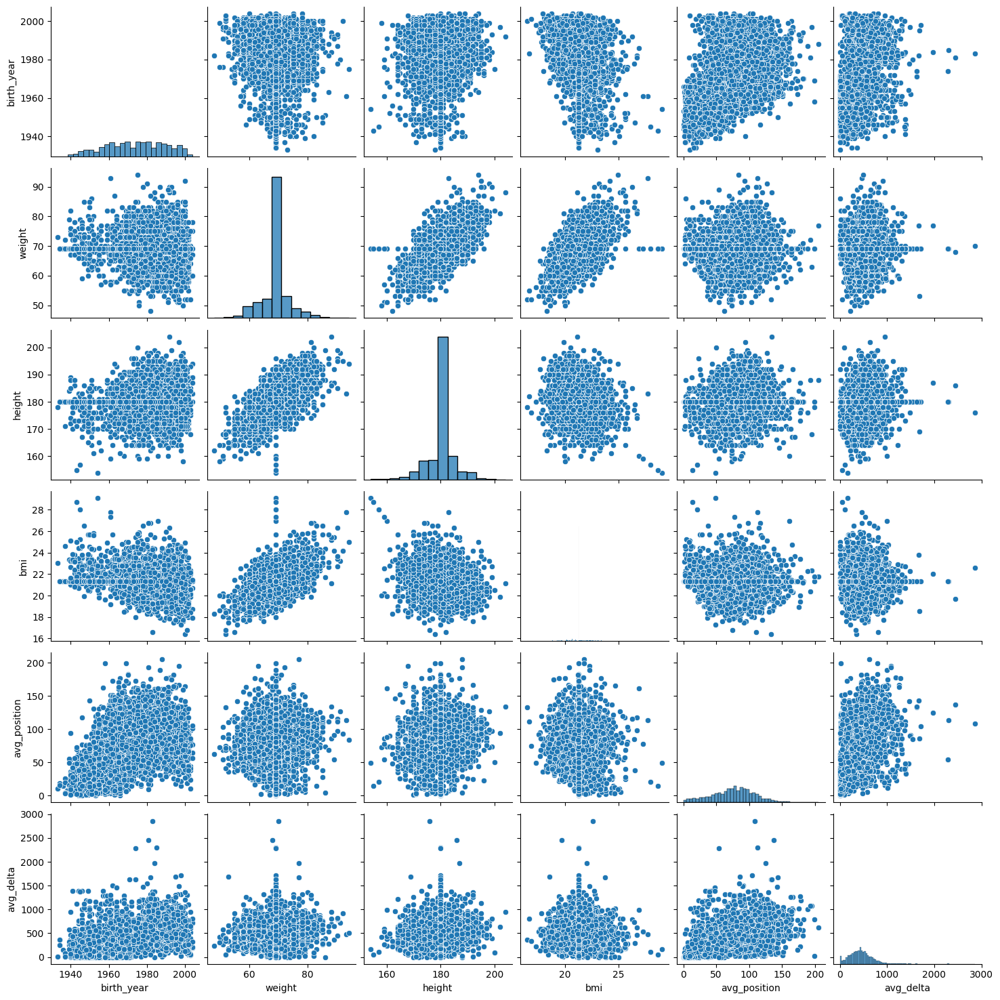

In [180]:
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
sns.pairplot(cyclists)

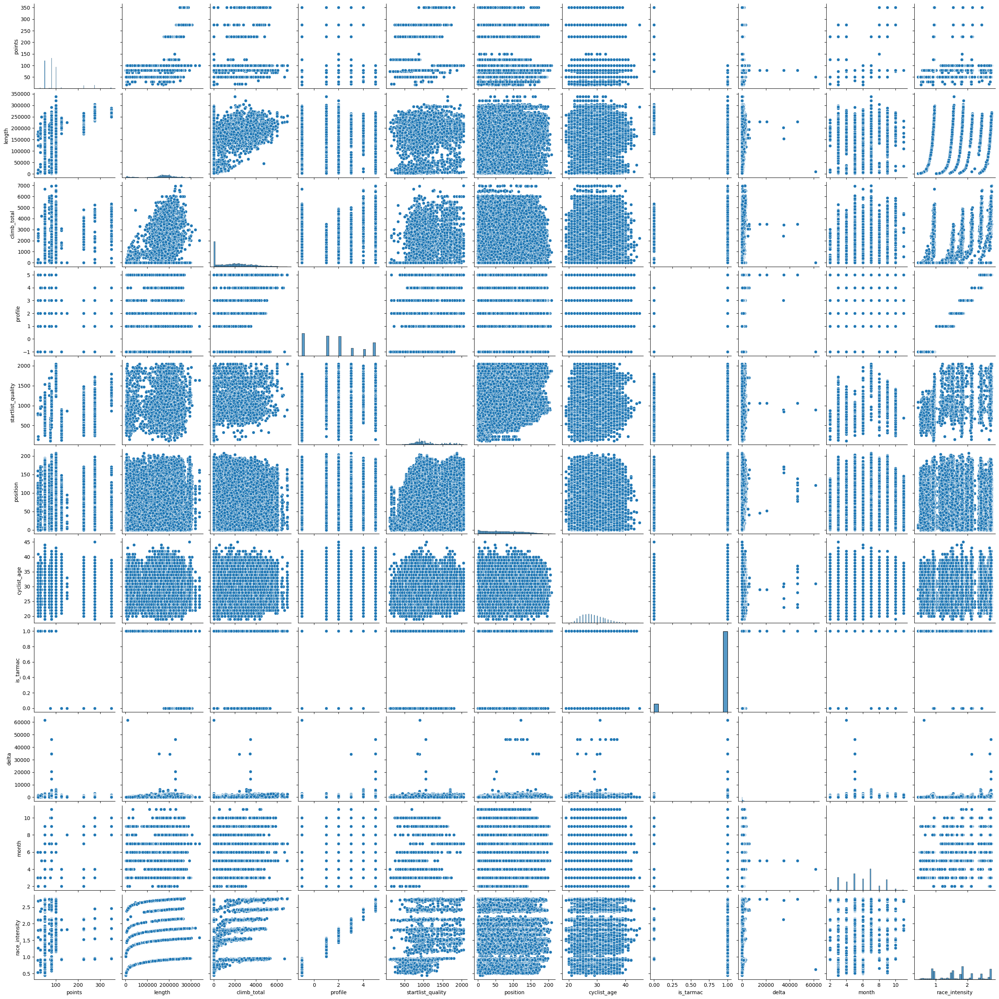

In [181]:
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
races_sampled = races.sample(frac=0.1, random_state=42)
sns.pairplot(races_sampled)

We decide to apply the clustering on these pairs of features:
1. *weight* and *height*
2. *BMI* and *avg_position*
3. *avg_delta* and *avg_position*
4. *points* and *race_intensity*
5. *points* and *startlist_quality*

In the following, we create the dataframe slice of the original dataset to pass it to the clustering algorithm. Notice that for *data_pri* and *data_psq* we apply *.drop_duplicates()*, since races entries are duplicates in those attributes but differ only for attributes regarding the cyclist who attended the race.

In [182]:
data_wh = cyclists[['weight', 'height']]
data_bap = cyclists[['bmi', 'avg_position']]
data_adap = cyclists[['avg_delta', 'avg_position']]
data_pri = races.drop_duplicates(subset='_url')[['points', 'race_intensity']]
data_psq = races.drop_duplicates(subset='_url')[['points', 'startlist_quality']]

## Normalization

Normalization is a crucial step in data preparation, especially when dealing with clustering algorithms. Normalization ensures that features with different scales contribute equally to the clustering process. Since clustering methods like k-means rely on distance metrics, unnormalized data can lead to biased groupings dominated by features with larger numerical ranges.

We decided to apply the two types of normalization for each pair of features and evaluate which was the most appropriate for each single case. In the following we have a function that apply the two most common normalizations techniques:
- Standard scaler: use of the formula $z=\frac{x-\mu}{\sigma}$ with $\mu$ is the mean and $\sigma$ is the standard deviation. Keeps features distributed around a mean of 0 and standard deviation of 1. Recommended when features have Gaussian distributions.
- Min-Max scaler: trasform and scale the input data to falls in the [0,1] range.

We also use a function to show the results of the two normalizations next to each other. We show a summary of the new values, the total variability of the features and the preliminary evaluation of the distances.

In [183]:
# Initializing normalizers
scaler_standard = StandardScaler()
scaler_minmax = MinMaxScaler()

# Function to normalize data using both StandardScaler and MinMaxScaler
def normalize_data(df, columns):
    # Standardization (mean=0, std=1)
    standard_normalized = scaler_standard.fit_transform(df)
    standard_normalized_df = pd.DataFrame(standard_normalized, columns=columns)
    
    # Min-Max Scaling (values between 0 and 1)
    minmax_normalized = scaler_minmax.fit_transform(df)
    minmax_normalized_df = pd.DataFrame(minmax_normalized, columns=columns)
    
    return standard_normalized_df, minmax_normalized_df

# Function to compare Standardization and Min-Max Scaling with histograms
def plot_normalization(data_standard, data_minmax, columns, title_prefix):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    # Plot for Standardized data
    for col in columns:
        sns.histplot(data_standard[col], kde=True, ax=axes[0], label=col, alpha=0.6)
    axes[0].set_title(f"{title_prefix} - Standardized (Mean=0, Std=1)", fontsize=14)
    axes[0].set_xlabel("Values", fontsize=12)
    axes[0].set_ylabel("Frequency", fontsize=12)
    axes[0].legend()
    
    # Plot for Min-Max Scaled data
    for col in columns:
        sns.histplot(data_minmax[col], kde=True, ax=axes[1], label=col, alpha=0.6)
    axes[1].set_title(f"{title_prefix} - Min-Max Scaled (0 to 1)", fontsize=14)
    axes[1].set_xlabel("Values", fontsize=12)
    axes[1].set_ylabel("")
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

First we see the pair 'weight' and 'height'.
Overall StandardScaler offers better normalization as it has a higher total variance while also maintaining the higher average distance to avoid information loss.

Standard normalization summary:
             weight        height
count  6.134000e+03  6.134000e+03
mean   1.811687e-15  1.868447e-15
std    1.000082e+00  1.000082e+00
min   -4.629239e+00 -5.616318e+00
25%    3.805898e-02  2.053505e-02
50%    3.805898e-02  2.053505e-02
75%    3.805898e-02  2.053505e-02
max    5.594366e+00  5.223784e+00
Total variance (Standard): 2.000326104679602
Average distance (Standard): 1.4595984500902277

Min-Max normalization summary:
            weight       height
count  6134.000000  6134.000000
mean      0.452799     0.518106
std       0.097821     0.092258
min       0.000000     0.000000
25%       0.456522     0.520000
50%       0.456522     0.520000
75%       0.456522     0.520000
max       1.000000     1.000000
Total variance (Min-Max): 0.0180803756783603
Average distance (Min-Max): 0.13874624944232625


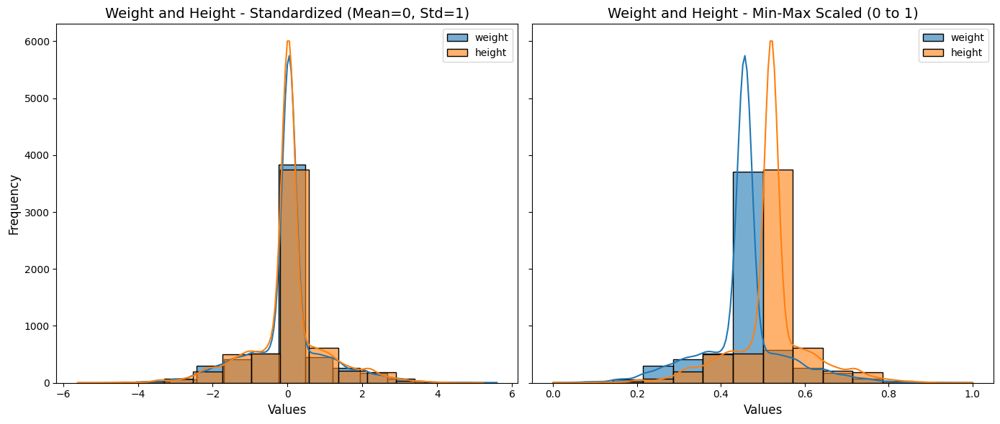

In [184]:
data_wh_standard, data_wh_minmax = normalize_data(cyclists[['weight', 'height']], ['weight', 'height'])

standard_summary = data_wh_standard.describe()
minmax_summary = data_wh_minmax.describe()

standard_variance = data_wh_standard.var(axis=0).sum()
minmax_variance = data_wh_minmax.var(axis=0).sum()

standard_distances = pdist(data_wh_standard)
minmax_distances = pdist(data_wh_minmax)


print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_wh_standard, data_wh_minmax, ['weight', 'height'], "Weight and Height")

For the pair 'bmi' and 'avg_position' we have a similar situation with once again StandardScaler which has a higher total variance and average distance.

Standard normalization summary:
                bmi  avg_position
count  6.134000e+03  6.134000e+03
mean  -2.145876e-15  7.123961e-17
std    1.000082e+00  1.000082e+00
min   -4.834627e+00 -2.301643e+00
25%   -1.245299e-01 -6.656579e-01
50%    3.868743e-02  6.144648e-02
75%    3.868743e-02  6.673668e-01
max    7.819250e+00  3.909040e+00
Total variance (Standard): 2.000326104679602
Average distance (Standard): 1.706399972560123

Min-Max normalization summary:
               bmi  avg_position
count  6134.000000   6134.000000
mean      0.382067      0.370594
std       0.079034      0.161026
min       0.000000      0.000000
25%       0.372226      0.263415
50%       0.385124      0.380488
75%       0.385124      0.478049
max       1.000000      1.000000
Total variance (Min-Max): 0.0180803756783603
Average distance (Min-Max): 0.2160589625795502


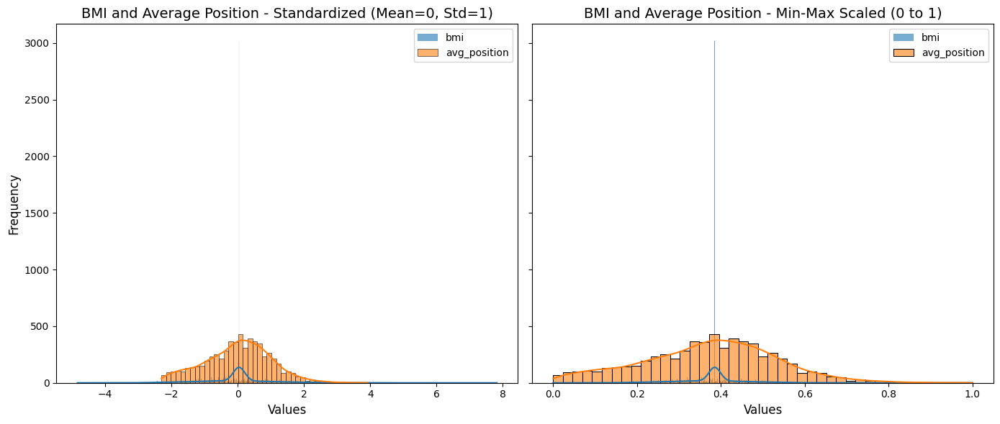

In [185]:
data_bap_standard, data_bap_minmax = normalize_data(cyclists[['bmi', 'avg_position']], ['bmi', 'avg_position'])

standard_summary = data_bap_standard.describe()
minmax_summary = data_bap_minmax.describe()

standard_variance = data_bap_standard.var(axis=0).sum()
minmax_variance = data_wh_minmax.var(axis=0).sum()

standard_distances = pdist(data_bap_standard)
minmax_distances = pdist(data_bap_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_bap_standard, data_bap_minmax, ['bmi', 'avg_position'], "BMI and Average Position")

The same argument can be made for the pair 'avg_delta' and 'avg_position'.

Standard normalization summary:
          avg_delta  avg_position
count  6.134000e+03  6.134000e+03
mean   2.698997e-16  7.123961e-17
std    1.000082e+00  1.000082e+00
min   -1.814555e+00 -2.301643e+00
25%   -6.658658e-01 -6.656579e-01
50%   -6.460478e-02  6.144648e-02
75%    5.448062e-01  6.673668e-01
max    9.904063e+00  3.909040e+00
Total variance (Standard): 2.000326104679602
Average distance (Standard): 1.684932755843625

Min-Max normalization summary:
         avg_delta  avg_position
count  6134.000000   6134.000000
mean      0.154844      0.370594
std       0.085341      0.161026
min       0.000000      0.000000
25%       0.098023      0.263415
50%       0.149331      0.380488
75%       0.201334      0.478049
max       1.000000      1.000000
Total variance (Min-Max): 0.033212506784389556
Average distance (Min-Max): 0.21585461168584688


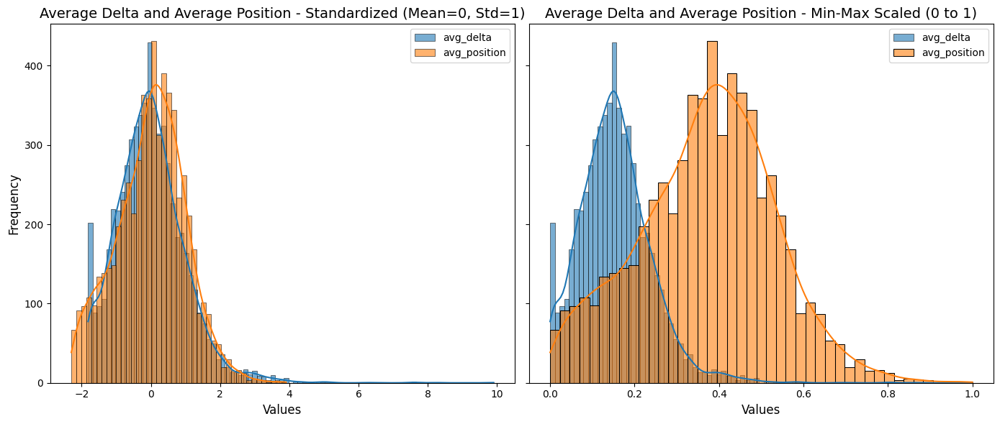

In [186]:
data_adap_standard, data_adap_minmax = normalize_data(cyclists[['avg_delta', 'avg_position']], ['avg_delta', 'avg_position'])

standard_summary = data_adap_standard.describe()
minmax_summary = data_adap_minmax.describe()

standard_variance = data_adap_standard.var(axis=0).sum()
minmax_variance = data_adap_minmax.var(axis=0).sum()

standard_distances = pdist(data_adap_standard)
minmax_distances = pdist(data_adap_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_adap_standard, data_adap_minmax, ['avg_delta', 'avg_position'], "Average Delta and Average Position")

Even in this case the StandardScaler values ​​are better but a higher average distance can be noticed for Min-Max.

Standard normalization summary:
             points  race_intensity
count  5.281000e+03    5.281000e+03
mean   2.825487e-17    5.112786e-17
std    1.000095e+00    1.000095e+00
min   -1.164080e+00   -1.577649e+00
25%   -6.427917e-01   -8.598366e-01
50%   -1.540836e-01   -5.804468e-03
75%    1.717219e-01    5.551806e-01
max    4.244290e+00    1.964638e+00
Total variance (Standard): 2.0003787878787875
Average distance (Standard): 1.640111996905608

Min-Max normalization summary:
            points  race_intensity
count  5281.000000     5281.000000
mean      0.215237        0.445376
std       0.184916        0.282330
min       0.000000        0.000000
25%       0.096386        0.202641
50%       0.186747        0.443737
75%       0.246988        0.602105
max       1.000000        1.000000
Total variance (Min-Max): 0.11390434467610859
Average distance (Min-Max): 0.3992565200022438


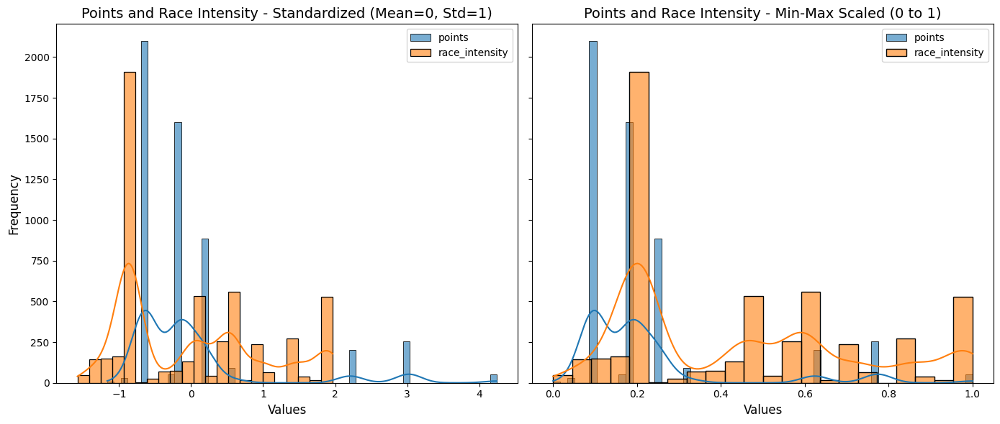

In [187]:
data_pri_standard, data_pri_minmax = normalize_data(
    races.drop_duplicates(subset='_url')[['points', 'race_intensity']], ['points', 'race_intensity']
)

standard_summary = data_pri_standard.describe()
minmax_summary = data_pri_minmax.describe()

standard_variance = data_pri_standard.var(axis=0).sum()
minmax_variance = data_pri_minmax.var(axis=0).sum()

standard_distances = pdist(data_pri_standard)
minmax_distances = pdist(data_pri_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_pri_standard, data_pri_minmax, ['points', 'race_intensity'], "Points and Race Intensity")

You can see how even for the pair 'points' 'startlist_quality' there is a better data distribution for StandardScaler. Despite this common trend it was decided to show when appropriate also the version of the features normalized with Min-Max.

Standard normalization summary:
             points  startlist_quality
count  5.281000e+03       5.281000e+03
mean   2.825487e-17      -5.583701e-17
std    1.000095e+00       1.000095e+00
min   -1.164080e+00      -2.296707e+00
25%   -6.427917e-01      -6.353630e-01
50%   -1.540836e-01      -1.884825e-01
75%    1.717219e-01       4.634372e-01
max    4.244290e+00       2.781958e+00
Total variance (Standard): 2.000378787878788
Average distance (Standard): 1.6080104521106395

Min-Max normalization summary:
            points  startlist_quality
count  5281.000000        5281.000000
mean      0.215237           0.452226
std       0.184916           0.196921
min       0.000000           0.000000
25%       0.096386           0.327122
50%       0.186747           0.415114
75%       0.246988           0.543478
max       1.000000           1.000000
Total variance (Min-Max): 0.072971762125659
Average distance (Min-Max): 0.3086706759657576


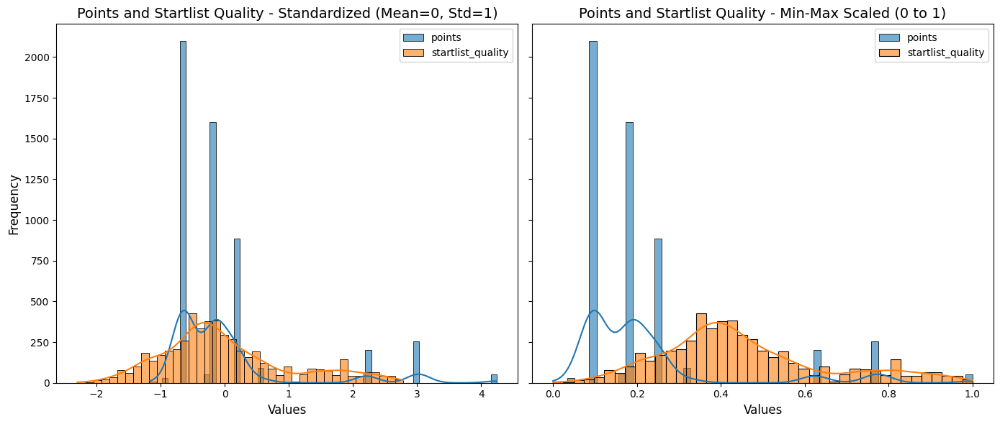

In [188]:
data_psq_standard, data_psq_minmax = normalize_data(
    races.drop_duplicates(subset='_url')[['points', 'startlist_quality']], ['points', 'startlist_quality']
)

standard_summary = data_psq_standard.describe()
minmax_summary = data_psq_minmax.describe()

standard_variance = data_psq_standard.var(axis=0).sum()
minmax_variance = data_psq_minmax.var(axis=0).sum()

standard_distances = pdist(data_psq_standard)
minmax_distances = pdist(data_psq_minmax)

print("Standard normalization summary:")
print(standard_summary)
print(f"Total variance (Standard): {standard_variance}")
print(f"Average distance (Standard): {standard_distances.mean()}")

print("\nMin-Max normalization summary:")
print(minmax_summary)
print(f"Total variance (Min-Max): {minmax_variance}")
print(f"Average distance (Min-Max): {minmax_distances.mean()}")

plot_normalization(data_psq_standard, data_psq_minmax, ['points', 'startlist_quality'], "Points and Startlist Quality")

## K-means Clustering

Let's start this task with K-means clustering.
K-Means clustering is an algorithm that groups data points into *k distinct clusters* based on their similarity. It minimizes the sum of squared distances between each point and the centroid of its assigned cluster. The algorithm iteratively updates centroids and reassigns points until convergence. 
For better approximate the number of clusters, we apply the Elbow method.

In [189]:
def plot_elbow(data1, data2):
    """
    Plots two side-by-side Elbow Method graphs.
    
    :param data1: First standardized dataset
    :param data2: Second standardized dataset
    """

    titles = ['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns
    
    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        inertia = []
        k_values = range(1, 11)
        
        # Calculate inertia for each value of k
        for k in k_values:
            kmeans = KMeans(n_clusters=k, random_state=0)
            kmeans.fit(data)
            inertia.append(kmeans.inertia_)
        
        # Plot the graph
        ax.plot(k_values, inertia, 'bo-')
        ax.set_xlabel('Number of Clusters k')
        ax.set_ylabel('Inertia')
        ax.set_title(title)

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

In [190]:
def analyze_and_plot_clusters(data1, data2, n_clusters, xlabel, ylabel):
    """
    Analyzes and plots side-by-side scatter plots for K-means clustering results.
    Additionally, computes and prints cluster statistics: centroids, size, silhouette score, and cohesion.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param n_clusters: Numbers of clusters for K-means (Array of 2 integers)
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles = ['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns
    
    for i, (data, n_cluster, title, ax) in enumerate(zip([data1, data2], n_clusters, titles, axes)):
        # Fit K-means clustering
        kmeans = KMeans(n_clusters=n_cluster, random_state=42)
        kmeans.fit(data)
        
        # Print cluster statistics
        print(f"\n--- {title} ---")
        print("Cluster centroids [weight height]:")
        print(kmeans.cluster_centers_)
        print("Number of cyclists in each cluster:")
        print(pd.Series(kmeans.labels_).value_counts().sort_index())
        
        # Compute silhouette score
        silhouette = silhouette_score(data, kmeans.labels_, metric='euclidean')
        print(f"Silhouette score: {silhouette}")
        
        # Compute cohesion (sum of squared distances to centroids)
        cohesion = kmeans.inertia_
        print(f"Cohesion: {cohesion}")
        
        # Plot each cluster with a different color
        for cluster_id in range(n_cluster):
            cluster_data = data[kmeans.labels_ == cluster_id]
            ax.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}')
        
        # Plot the centroids
        centroids = kmeans.cluster_centers_
        ax.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
        
        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend()
        ax.grid(True)
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applying K-Means to *weight* and *height*.

From the application of the Elbow method we decide to use $k=3$ for both the normalizations.

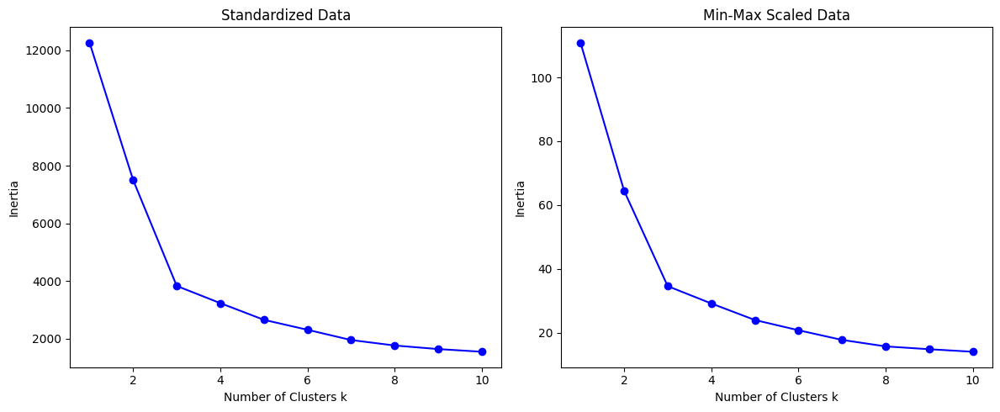

In [191]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_wh_standard, data_wh_minmax)

The created clusters look very similar and we have given the 3 clusters, the 3 centroids group the cyclists in a way such that one group contains the shorter and thinner cyclists, the medium high and normal weighted cyclists and the higher and heavier cyclists. By constraction, no outlier is left because they are included in the nearest cluster.

As regards the silhouette score values ​​they are practically identical while the cohesion is decidedly lower for the cluster created with Min-Max which therefore in this case is more compact and therefore preferable.


--- Standardized Data ---
Cluster centroids [weight height]:
[[ 1.65118518  1.67255487]
 [ 0.03123175  0.02488255]
 [-1.60059613 -1.58542476]]
Number of cyclists in each cluster:
0     742
1    4538
2     854
Name: count, dtype: int64
Silhouette score: 0.6464171476158215
Cohesion: 3827.6058672795803

--- Min-Max Scaled Data ---
Cluster centroids [weight height]:
[[0.61685862 0.66704636]
 [0.45548508 0.52060217]
 [0.29502925 0.37457077]]
Number of cyclists in each cluster:
0     755
1    4517
2     862
Name: count, dtype: int64
Silhouette score: 0.6464320492177721
Cohesion: 34.54109088060794


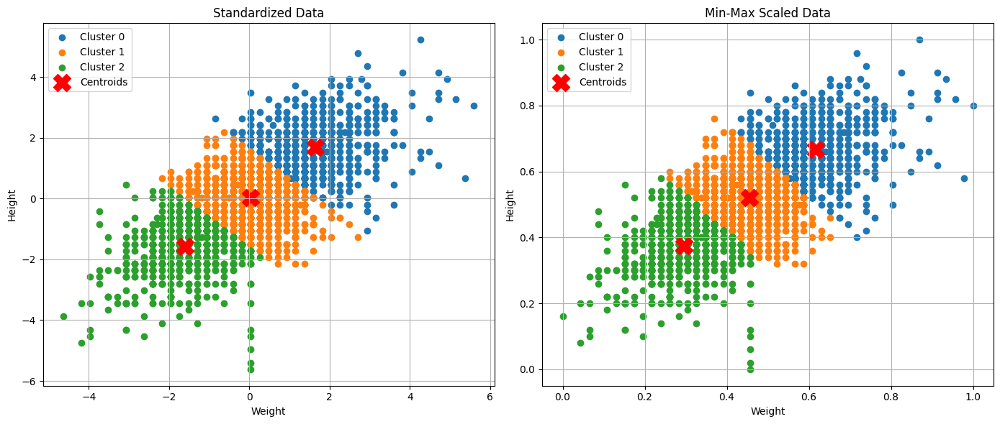

In [192]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_wh_standard.values, data_wh_minmax.values, [3,3], xlabel='Weight', ylabel='Height')

### 2. Applying K-Means to *bmi* and *avg_position*.

From this pair of feature the Elbow method results different between the two normalizations: for StandardScaler we chose $k=4$ while for Min-Max $k=3$.

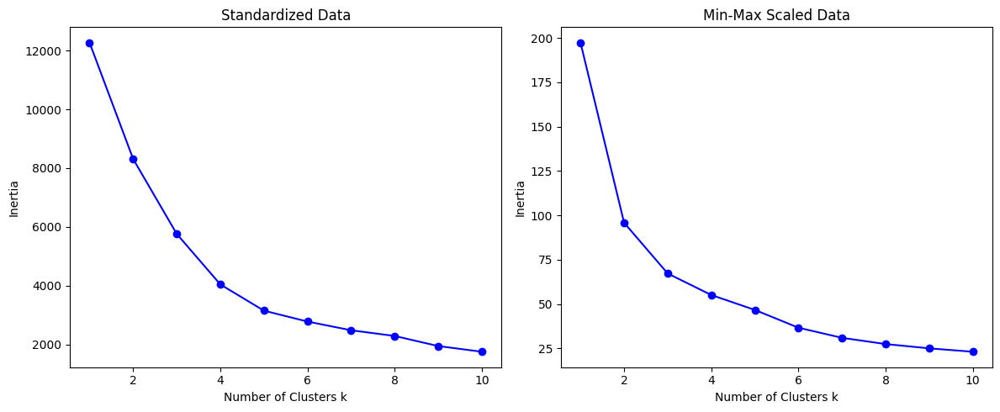

In [193]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_bap_standard, data_bap_minmax)

The cyclists are more or less equally distributed, but we can point out the presence of a certain number of noisy values.
The silhouette score is higher in the StandardScore while the cohesion is lower in the Min-Max.


--- Standardized Data ---
Cluster centroids [weight height]:
[[ 0.04401533  0.71288593]
 [ 0.04751696 -1.02918073]
 [-1.62218072  0.15687893]
 [ 2.01620082  0.21147896]]
Number of cyclists in each cluster:
0    2624
1    2066
2     858
3     586
Name: count, dtype: int64
Silhouette score: 0.4364588991616587
Cohesion: 4044.2676412524115

--- Min-Max Scaled Data ---
Cluster centroids [weight height]:
[[0.39099983 0.55452082]
 [0.39051274 0.15930664]
 [0.37170018 0.37065157]]
Number of cyclists in each cluster:
0    1780
1    1553
2    2801
Name: count, dtype: int64
Silhouette score: 0.38261835483264733
Cohesion: 67.21019609281608


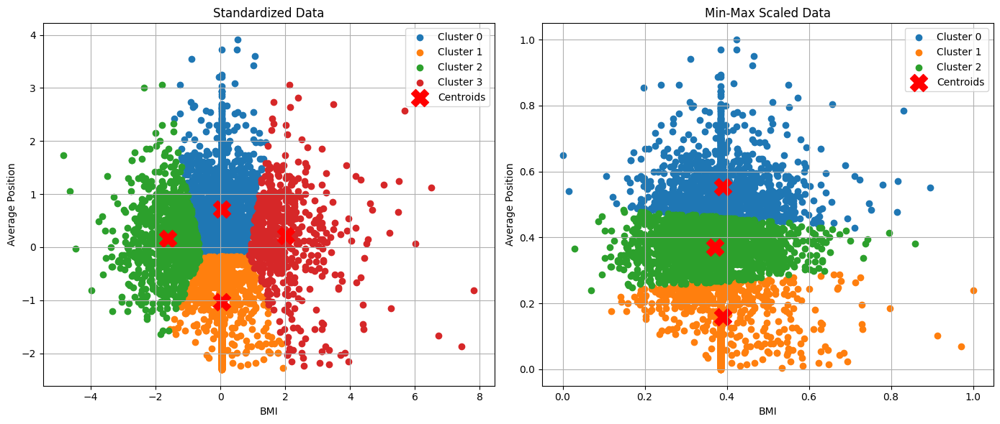

In [194]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_bap_standard.values, data_bap_minmax.values, [4,3], xlabel='BMI', ylabel='Average Position')

### 3. Applying K-Means to *avg_delta* and *avg_position*.

From the application of the Elbow method we decide to use $k=3$ for both the normalization.

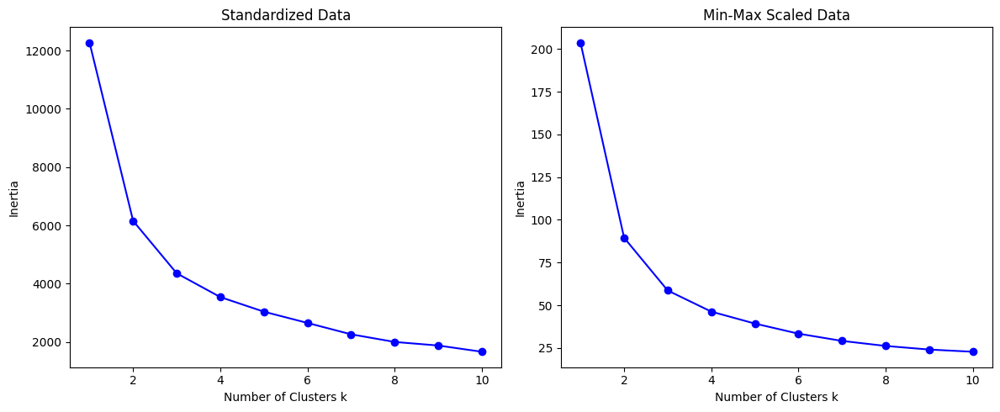

In [195]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_adap_standard, data_adap_minmax)

The two cluster divisions in this case are visibly different with StandardScaler concentrating most of the points in Cluster 0 while Min-Max concentrates them in Cluster 1. The silhouette score this time is higher for Min-Max which also has a lower cohesion thus resulting in the most suitable normalization.


--- Standardized Data ---
Cluster centroids [weight height]:
[[-0.03270195  0.24177444]
 [-0.92496064 -1.15123612]
 [ 1.28856941  1.01325535]]
Number of cyclists in each cluster:
0    2908
1    1832
2    1394
Name: count, dtype: int64
Silhouette score: 0.38758293891825296
Cohesion: 4355.161265609024

--- Min-Max Scaled Data ---
Cluster centroids [weight height]:
[[0.22195482 0.54771965]
 [0.15095979 0.36628627]
 [0.07825332 0.157673  ]]
Number of cyclists in each cluster:
0    1875
1    2738
2    1521
Name: count, dtype: int64
Silhouette score: 0.414710753687812
Cohesion: 58.67495448652807


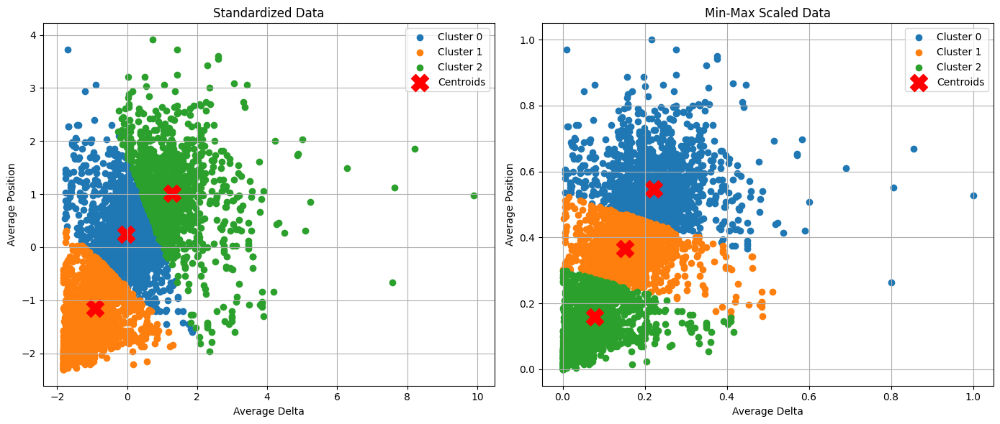

In [196]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_adap_standard.values, data_adap_minmax.values, [3,3], xlabel='Average Delta', ylabel='Average Position')

### 4. Applying K-Means to *points* and *race_intensity*.

For the Elbow method, we consider $k=3$.

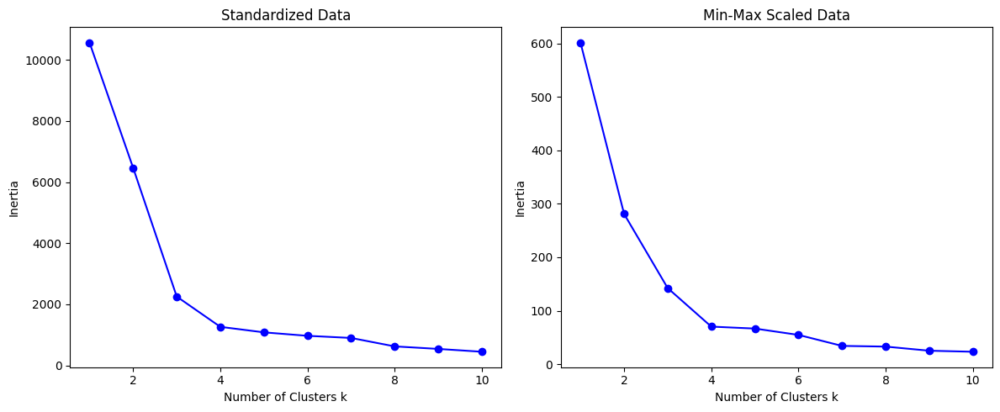

In [197]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_pri_standard, data_pri_minmax)

For 'points' and 'race_intensity' the split is very similar, as is the silhouette score. As for the other features the cohesion is lower for Min-Max


--- Standardized Data ---
Cluster centroids [weight height]:
[[-0.36541353 -0.68509222]
 [-0.2012747   1.14761246]
 [ 2.8284735  -0.17798564]]
Number of cyclists in each cluster:
0    2938
1    1833
2     510
Name: count, dtype: int64
Silhouette score: 0.5856305051191256
Cohesion: 2206.1083257989576

--- Min-Max Scaled Data ---
Cluster centroids [weight height]:
[[0.13471907 0.19926462]
 [0.183284   0.69546894]
 [0.73821758 0.39512985]]
Number of cyclists in each cluster:
0    2356
1    2415
2     510
Name: count, dtype: int64
Silhouette score: 0.6069286796545613
Cohesion: 149.1529134232084


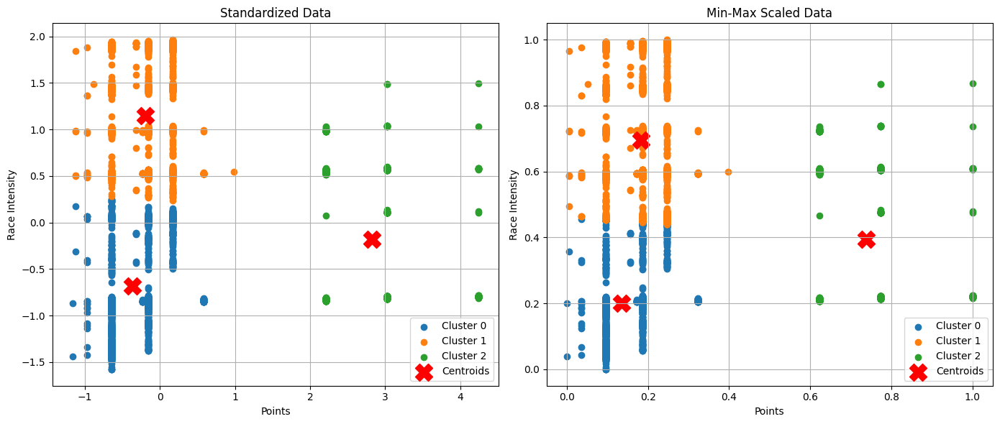

In [198]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_pri_standard.values, data_pri_minmax.values, [3,3], xlabel='Points', ylabel='Race Intensity')

### 5. Applying K-Means to *points* and *startlist_quality*.

For the Elbow method, we take $k=3$.

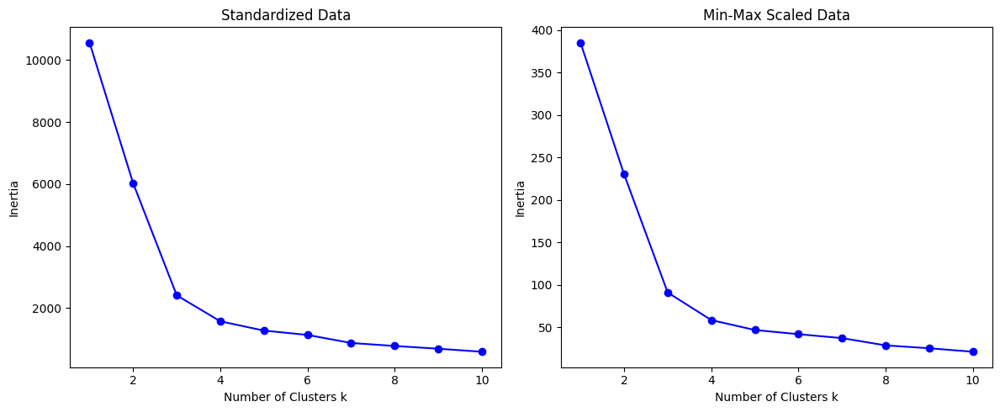

In [199]:
# Plot the elbow method for Standardized and Min-Max Scaled data
plot_elbow(data_psq_standard, data_psq_minmax)

The same argument made above also applies to 'points' and 'startlist_quality'.


--- Standardized Data ---
Cluster centroids [weight height]:
[[-0.41793542 -0.42368372]
 [ 2.8284735  -0.17881816]
 [ 0.11589653  1.62142013]]
Number of cyclists in each cluster:
0    3738
1     510
2    1033
Name: count, dtype: int64
Silhouette score: 0.6224848964859909
Cohesion: 2412.0058614172062

--- Min-Max Scaled Data ---
Cluster centroids [weight height]:
[[0.13796115 0.36880225]
 [0.73821758 0.41701681]
 [0.23666593 0.7714876 ]]
Number of cyclists in each cluster:
0    3738
1     510
2    1033
Name: count, dtype: int64
Silhouette score: 0.6230396415938328
Cohesion: 91.06692249572109


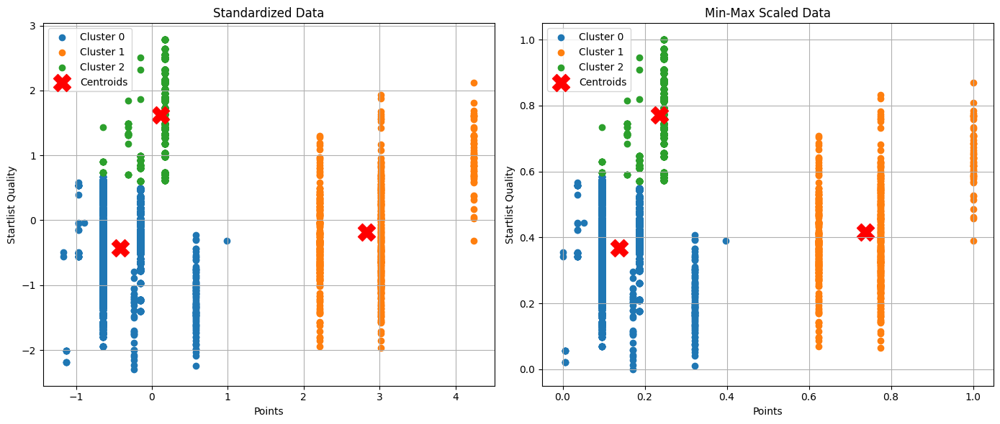

In [200]:
# Analyze and plot clusters for Standardized and Min-Max Scaled data
analyze_and_plot_clusters(data_psq_standard.values, data_psq_minmax.values, [3,3], xlabel='Points', ylabel='Startlist Quality')

## Density-Based Clustering

DBSCAN creates clusters based on dense points employing two parameters: ***eps*** (= *max admissible distance between two near points belonging to the same cluster*) and ***min_samples*** (= *minimum number of required points for a cluster to be defined*). 
As we have done with K-mean clustering, we first proceed computing the appropriate value for these two parameters and then show the output of clustering. 
Let's begin with the easier variable to define, *min_points*. The choice of *min_samples* is pretty arbitrary: the more our data is omogenous, the more we can increase this value. Tipically, it is defined to be the size of our feature plus 1 (for us, always 3).
For what concerns *eps* we use the elbow method using K-NN distance graph presented below. We try to estimate the most suitable epsilon value, in case the estimate is not satisfactory we proceed to manually modify this value.

In [201]:
def analyze_and_plot_knn(data1, data2, min_samples):
    """
    Analyzes and plots side-by-side K-NN distance graphs for two datasets,
    highlighting the elbow point and returning estimated epsilon values.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param min_samples: Number of neighbors to consider for K-NN distance
    :return: Estimated epsilon values for data1 and data2
    """
    titles = ['Standardized Data', 'Min-Max Scaled Data']
    epsilons = []  # Store estimated epsilon values

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns
    
    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        # Compute the pairwise Euclidean distances
        dist = pdist(data, 'euclidean')
        dist = squareform(dist)  # Convert to square matrix
        
        # Compute the k-th nearest distances
        kth_distances = []
        for d in dist:
            index_kth_distance = np.argsort(d)[min_samples]
            kth_distances.append(d[index_kth_distance])
        
        # Sort the k-th distances for plotting
        sorted_kth_distances = sorted(kth_distances)
        
        # Estimate the elbow point
        elbow_index = np.argmax(np.gradient(sorted_kth_distances))
        estimated_epsilon = sorted_kth_distances[elbow_index]
        epsilons.append(estimated_epsilon)
        
        # Plot the distances
        ax.plot(range(len(sorted_kth_distances)), sorted_kth_distances, label='Sorted Distances')
        ax.axvline(x=elbow_index, color='red', linestyle='--', label='Elbow Point')
        ax.set_ylabel(f'Distance from {min_samples}th Neighbor')
        ax.set_xlabel('Sorted Distances')
        ax.set_title(title)
        ax.legend()
        
        # Print key statistics for analysis
        print(f"\n--- {title} ---")
        print(f"Minimum {min_samples}th distance: {np.min(kth_distances)}")
        print(f"Median {min_samples}th distance: {np.median(kth_distances)}")
        print(f"Maximum {min_samples}th distance: {np.max(kth_distances)}")
        print(f"Estimated epsilon (elbow point): {estimated_epsilon}")
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()
    
    return epsilons

In [202]:
def analyze_and_plot_dbscan(data1, data2, eps, min_samples, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side DBSCAN clustering results for two datasets.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param eps: The maximum distance between two samples for one to be considered as in the neighborhood of the other
    :param min_samples: The number of samples in a neighborhood for a point to be considered as a core point
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles=['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns
    
    for i, (data, epsilon, title, ax) in enumerate(zip([data1, data2], eps, titles, axes)):
        # Apply DBSCAN clustering
        dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
        dbscan.fit(data)
        
        # Extract labels and analyze clusters
        labels = dbscan.labels_
        unique_labels, counts = np.unique(labels, return_counts=True)
        label_mapping = {
            label: f"Cluster {label + 1}" if label != -1 else "Noise"
            for label in unique_labels
        }
        
        # Metrics Calculation
        num_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
        if num_clusters > 1:
            silhouette = silhouette_score(data, labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise
        
        cohesion = dbscan.core_sample_indices_.shape[0] if dbscan.core_sample_indices_ is not None else 0
        
        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print("Cluster Analysis:")
        for label, count in zip(unique_labels, counts):
            cluster_type = "Noise" if label == -1 else f"Cluster {label + 1}"
            print(f"{cluster_type}: {count} points")
        
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion (Core Points): {cohesion}")
        
        # Plot results with seaborn
        cluster_labels = [label_mapping[label] for label in labels]
        sns.scatterplot(
            x=data[:, 0],
            y=data[:, 1],
            hue=cluster_labels,
            palette="tab10",
            legend="full",
            ax=ax
        )
        
        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applying DBSCAN to *weight* and *height*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 1.461737690753013
Estimated epsilon (elbow point): 1.2876062962880628

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 0.1365771142195662
Estimated epsilon (elbow point): 0.12415613074476951


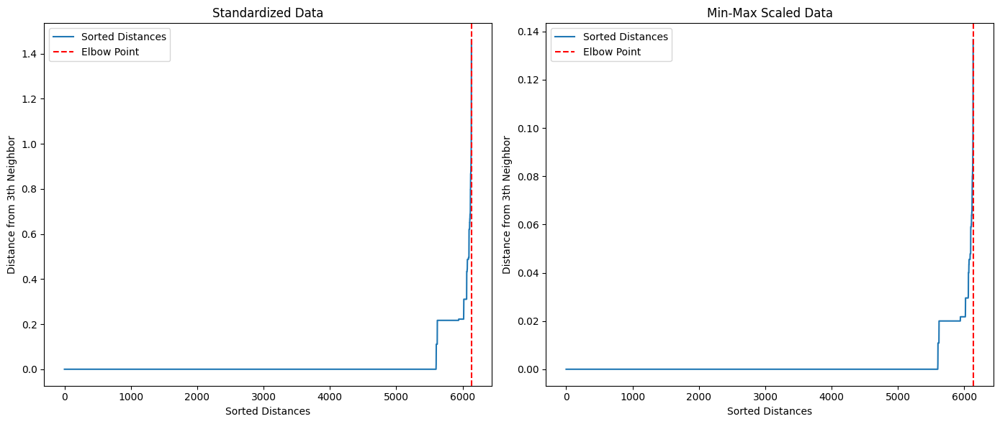

In [203]:
# Analyze and plot K-NN distances for Standardized and Min-Max Scaled data to choose the best value for eps
eps_wh = analyze_and_plot_knn(data_wh_standard.values, data_wh_minmax.values, 3)

Given the unsatisfactory estimate we choose as eps values ​​0.6 for the StandardScore and 0.05 for Min-Max.
Both plots show a larger clustering where most of the cyclists are located (that means their values ​​are not that far from the chosen epsilon values), while there are some smaller clusterings concentrated on the edge of the larger cluster. Some noisy values ​​are also identified on its edge.
Both silhouette and cohesion values ​​are equal

Epsilon for Standardized Data: 0.6
Epsilon for Min-Max Scaled Data: 0.05

--- Standardized Data ---
Cluster Analysis:
Noise: 7 points
Cluster 1: 6110 points
Cluster 2: 6 points
Cluster 3: 3 points
Cluster 4: 3 points
Cluster 5: 5 points
Silhouette Score: 0.6421529479607777
Cohesion (Core Points): 6115

--- Min-Max Scaled Data ---
Cluster Analysis:
Noise: 7 points
Cluster 1: 6110 points
Cluster 2: 6 points
Cluster 3: 3 points
Cluster 4: 3 points
Cluster 5: 5 points
Silhouette Score: 0.6376346789892465
Cohesion (Core Points): 6115


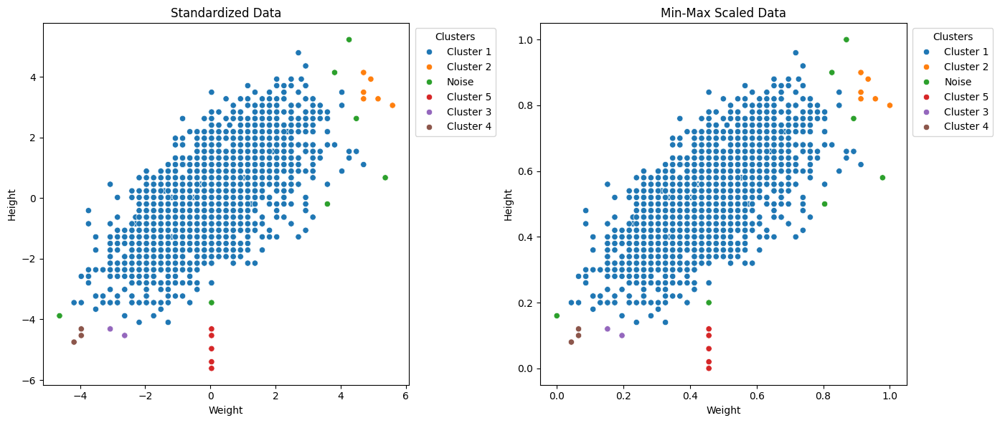

In [204]:
eps_wh = [0.6, 0.05]

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_wh[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_wh[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_wh_standard.values, data_wh_minmax.values, eps_wh, min_samples=3, xlabel='Weight', ylabel='Height')

### 2. Applying DBSCAN to *bmi* and *avg_position*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.029689170155483193
Maximum 3th distance: 2.304394438055409
Estimated epsilon (elbow point): 2.000310471404841

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0023462508636158397
Maximum 3th distance: 0.21882033872012416
Estimated epsilon (elbow point): 0.1618514255089426


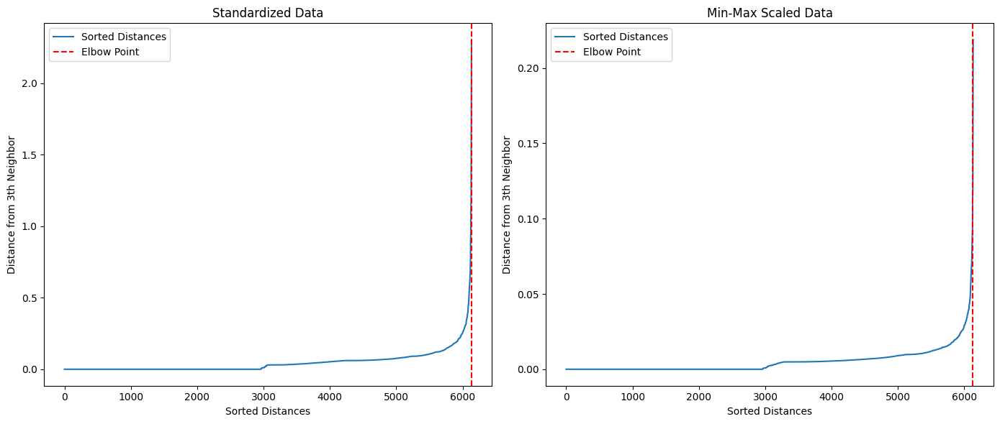

In [205]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data
eps_bap = analyze_and_plot_knn(data_bap_standard.values, data_bap_minmax.values, 3)

In this case too the epsilon values ​​are set manually.
We have a cluster containing most of the data with a few clusters surrounding it and some points identified as noise. According to the silhouette values ​​the best division is made with the data normalized through StandardScore.

Epsilon for Standardized Data: 0.4
Epsilon for Min-Max Scaled Data: 0.04

--- Standardized Data ---
Cluster Analysis:
Noise: 30 points
Cluster 1: 6093 points
Cluster 2: 5 points
Cluster 3: 3 points
Cluster 4: 3 points
Silhouette Score: 0.5794213513584017
Cohesion (Core Points): 6094

--- Min-Max Scaled Data ---
Cluster Analysis:
Noise: 37 points
Cluster 1: 6086 points
Cluster 2: 8 points
Cluster 3: 3 points
Silhouette Score: 0.4163699396041289
Cohesion (Core Points): 6087


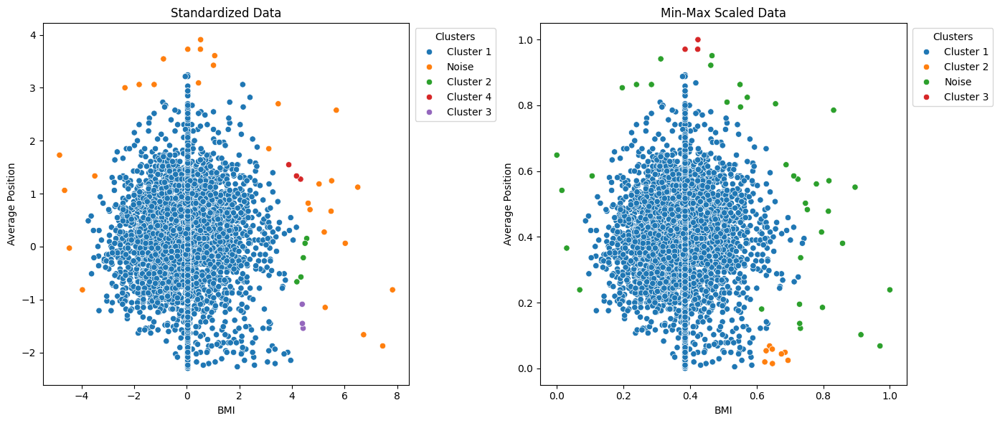

In [206]:
eps_bap = [0.4, 0.04]

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_bap[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_bap[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_bap_standard.values, data_bap_minmax.values, eps_bap, min_samples=3, xlabel='BMI', ylabel='Average Position')

### 3. Applying DBSCAN to *avg_delta* and *avg_position*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0322081839099774
Maximum 3th distance: 2.8506483807997074
Estimated epsilon (elbow point): 2.596280243218117

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.004673949354369489
Maximum 3th distance: 0.3203040736900854
Estimated epsilon (elbow point): 0.29114453165100457


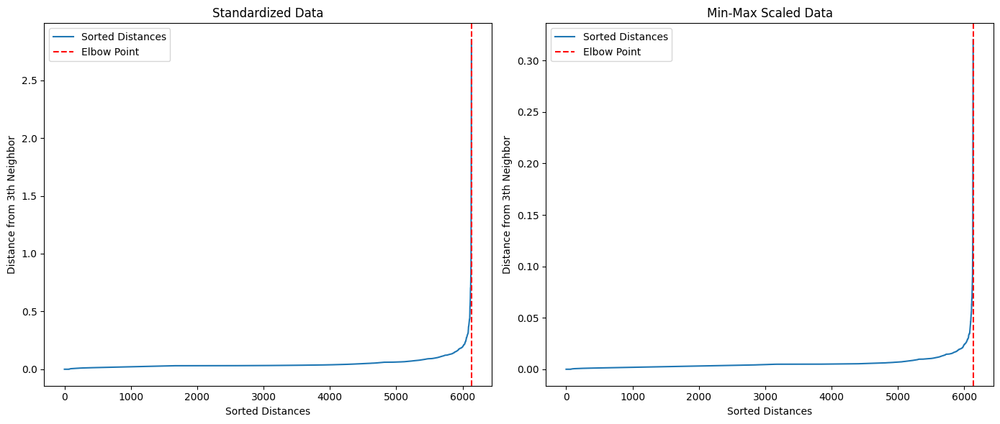

In [207]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data for choosing the best value for eps
eps_adap = analyze_and_plot_knn(data_adap_standard.values, data_adap_minmax.values, 3)

In this case too the epsilon values ​​are set manually.
The behavior is similar to the previous ones with a large central cluster and many small ones surrounding it. In this case we have even lower silhouette values ​​which, as visible even to the eye, identify the StandardScore as the best.

Epsilon for Standardized Data: 0.3
Epsilon for Min-Max Scaled Data: 0.03

--- Standardized Data ---
Cluster Analysis:
Noise: 31 points
Cluster 1: 6079 points
Cluster 2: 12 points
Cluster 3: 3 points
Cluster 4: 3 points
Cluster 5: 6 points
Silhouette Score: 0.39193185412268444
Cohesion (Core Points): 6091

--- Min-Max Scaled Data ---
Cluster Analysis:
Noise: 47 points
Cluster 1: 6063 points
Cluster 2: 9 points
Cluster 3: 4 points
Cluster 4: 3 points
Cluster 5: 8 points
Silhouette Score: 0.17733447372341107
Cohesion (Core Points): 6078


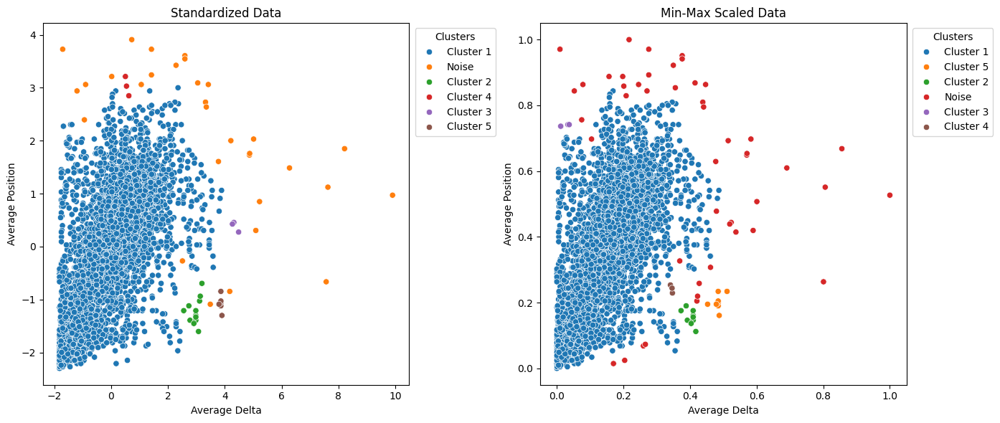

In [208]:
eps_adap = [0.3, 0.03]

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_adap[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_adap[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_adap_standard.values, data_adap_minmax.values, eps_adap, min_samples=3, xlabel='Average Delta', ylabel='Average Position')

### 4. Applying DBSCAN to *points* and *race_intensity*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0005219886702946264
Maximum 3th distance: 0.91439575396093
Estimated epsilon (elbow point): 0.91439575396093

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.00014735924931241762
Maximum 3th distance: 0.22592719293590804
Estimated epsilon (elbow point): 0.22592719293590804


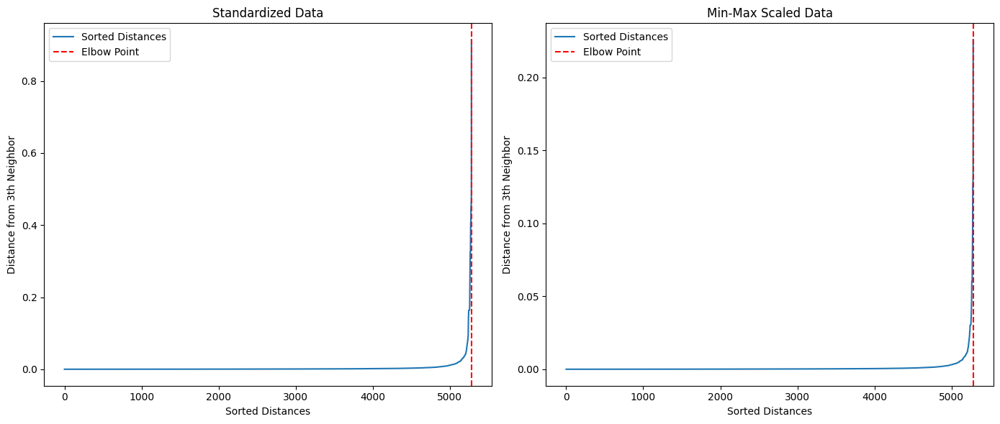

In [209]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data for choosing the best value for eps
eps_pri = analyze_and_plot_knn(data_pri_standard.values, data_pri_minmax.values, 3)

For 'points' and 'race_intensity' it was decided to manually change the epsilon only for the data normalized with Min-Max.
In this case, there are a number of clusters that are well separated from each other for the Standardized data, while for the data treated with Min-Max there are more clusters that are still well spaced from each other.

Epsilon for Standardized Data: 0.91439575396093
Epsilon for Min-Max Scaled Data: 0.15

--- Standardized Data ---
Cluster Analysis:
Cluster 1: 4771 points
Cluster 2: 457 points
Cluster 3: 53 points
Silhouette Score: 0.5901958499161968
Cohesion (Core Points): 5281

--- Min-Max Scaled Data ---
Cluster Analysis:
Cluster 1: 4771 points
Cluster 2: 157 points
Cluster 3: 116 points
Cluster 4: 99 points
Cluster 5: 41 points
Cluster 6: 85 points
Cluster 7: 12 points
Silhouette Score: 0.3493897180765502
Cohesion (Core Points): 5280


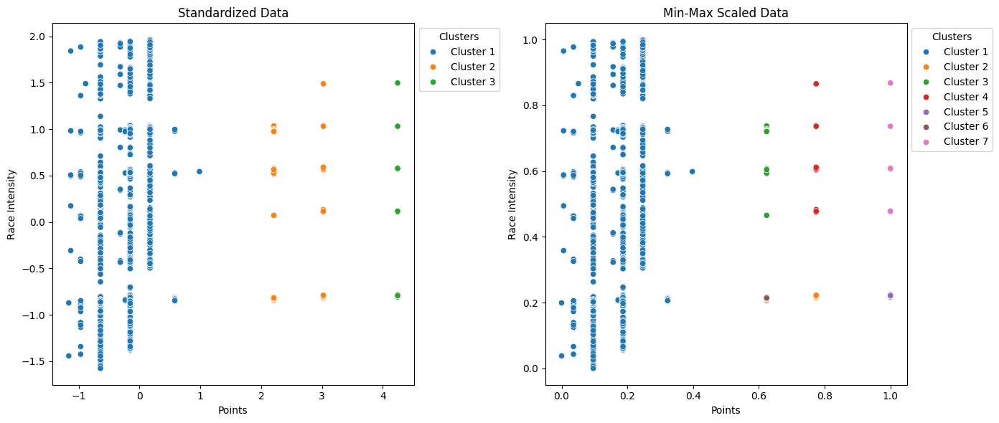

In [210]:
eps_pri[1] = 0.15

# Print the used epsilon values
print(f"Epsilon for Standardized Data: {eps_pri[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_pri[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_pri_standard.values, data_pri_minmax.values, eps_pri, min_samples=3, xlabel='Points', ylabel='Race Intensity')

### 5. Applying DBSCAN to *points* and *startlist_quality*.


--- Standardized Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 0.481053643256956
Estimated epsilon (elbow point): 0.4153296355060451

--- Min-Max Scaled Data ---
Minimum 3th distance: 0.0
Median 3th distance: 0.0
Maximum 3th distance: 0.09472049689440992
Estimated epsilon (elbow point): 0.07699175981136192


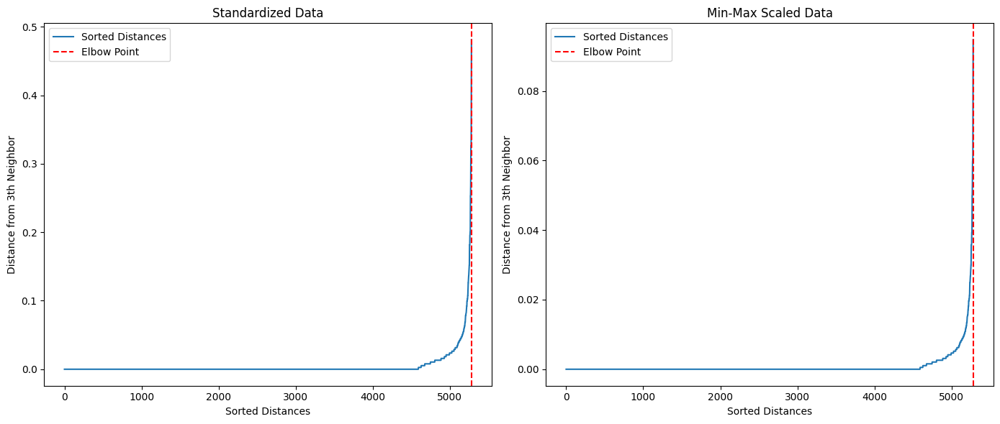

In [211]:
# analyze and plot K-NN distances for Standardized and Min-Max Scaled data for choosing the best value for eps
eps_psq = analyze_and_plot_knn(data_psq_standard.values, data_psq_minmax.values, 3)

In this case it was decided to keep the epsilon values ​​generated by the function.
These values ​​have highlighted a practically identical division of the dataframe which consists of 6 clusters without noise values, for obvious reasons also silhouette score and cohesion are equal.

Epsilon for Standardized Data: 0.4153296355060451
Epsilon for Min-Max Scaled Data: 0.07699175981136192

--- Standardized Data ---
Cluster Analysis:
Cluster 1: 4670 points
Cluster 2: 256 points
Cluster 3: 7 points
Cluster 4: 201 points
Cluster 5: 94 points
Cluster 6: 53 points
Silhouette Score: 0.2788909117423485
Cohesion (Core Points): 5280

--- Min-Max Scaled Data ---
Cluster Analysis:
Cluster 1: 4670 points
Cluster 2: 256 points
Cluster 3: 7 points
Cluster 4: 201 points
Cluster 5: 94 points
Cluster 6: 53 points
Silhouette Score: 0.26729748225367317
Cohesion (Core Points): 5280


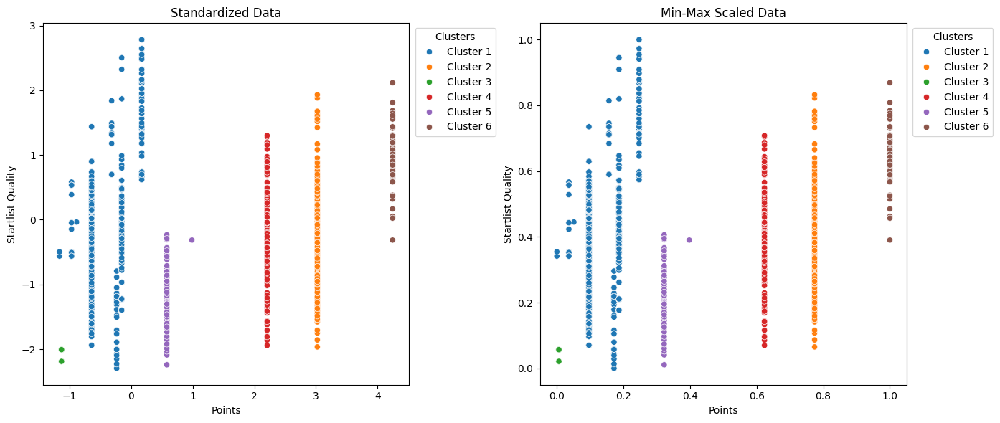

In [212]:
# Print the estimated epsilon values
print(f"Epsilon for Standardized Data: {eps_psq[0]}")
print(f"Epsilon for Min-Max Scaled Data: {eps_psq[1]}")

# Apply DBSCAN clustering to the data
analyze_and_plot_dbscan(data_psq_standard.values, data_psq_minmax.values, eps_psq, min_samples=3, xlabel='Points', ylabel='Startlist Quality')

## Hierarchical Clustering

The dendrograms provide a visualization of hierarchical clustering various methods:

1. *Complete Linkage*: this method shows clusters with a strong preference for compact groupings, as the distance between clusters is determined by their farthest points. In this case, the method has created clusters that are relatively distinct, with noticeable gaps between branches at higher linkage distances. This indicates the presence of well-separated clusters in the dataset.

2. *Single Linkage*:  in this method, clusters merge based on the closest points. This leads to an elongated structure where many points or smaller groups merge at low distances, resulting in one large cluster at higher levels. Very sensitive to  noise

3. *Average Linkage*: this methods provides a middle ground, balancing the behavior of complete and single linkage. The resulting clusters appear more uniform.

4. *Ward Linkage*: minimizes the variance within clusters at each step, resulting in highly compact and spherical clusters. 

In [213]:
def plot_dendogram(data):
    methods = ['complete', 'single', 'average','ward']
    plt.figure(figsize=(15, 10))
    for i, method in enumerate(methods, 1):
        plt.subplot(4, 1, i)
        data_dist = pdist(data, metric='euclidean')
        data_link = linkage(data_dist, method=method)
        dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
        plt.title(f'Dendrogram using {method} linkage')
    plt.tight_layout()
    plt.show()

def analyze_and_plot_hierarchical(data, x_col, y_col, n_clusters=3, xlabel=None, ylabel=None):
    """
    Creates scatter plots for different agglomerative clustering linkage methods.

    :param data: DataFrame containing the dataset.
    :param x_col: Column name for the x-axis.
    :param y_col: Column name for the y-axis.
    :param n_clusters: Number of clusters to form.
    :param xlabel: Label for the x-axis (default: same as x_col).
    :param ylabel: Label for the y-axis (default: same as y_col).
    """

    linkage_methods = ['single', 'average', 'complete', 'ward']
    
    # Create a plot for each linkage method
    plt.figure(figsize=(20, 15))
    for i, method in enumerate(linkage_methods, 1):
        # Create the clustering model
        agg_cluster = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage=method)
        
        # Copy the data to avoid modifying the original DataFrame
        temp_data = data.copy()
        temp_data['cluster'] = agg_cluster.fit_predict(temp_data[[x_col, y_col]])

        # Metrics Calculation
        cluster_labels = temp_data['cluster'].values
        if len(np.unique(cluster_labels)) > 1:
            silhouette = silhouette_score(temp_data[[x_col, y_col]], cluster_labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(np.linalg.norm(temp_data[[x_col, y_col]][cluster_labels == c] - temp_data[[x_col, y_col]][cluster_labels == c].mean(axis=0)) ** 2 for c in np.unique(cluster_labels))

        # Print cluster analysis and metrics
        print(f"\n--- {method.capitalize()} Linkage ---")
        print(f"Number of clusters: {len(np.unique(cluster_labels))}")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion: {cohesion}")
        
        # Create the scatter plot
        plt.subplot(2, 2, i)
        sns.scatterplot(data=temp_data, x=x_col, y=y_col, hue='cluster', palette=sns.color_palette(n_colors=n_clusters))
        plt.title(f'Agglomerative Clustering with {method.capitalize()} Linkage')
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.legend(title='Cluster')

    plt.tight_layout()
    plt.show()

In [214]:
def divisive_clustering(data, max_clusters=3):
    """
    Perform divisive hierarchical clustering to create a specified number of clusters.
    
    Parameters:
    - data (numpy array): Dataset where each row is a data point.
    - max_clusters (int): Maximum number of clusters to form.
    
    Returns:
    - numpy array: Array of cluster labels for each data point.
    """

    # Start with all points in one cluster
    clusters = {0: data}
    cluster_assignments = np.zeros(data.shape[0], dtype=int)
    next_cluster_id = 1

    # Dictionary to keep track of cluster splitting hierarchy
    parent_to_children = {}

    while len(clusters) < max_clusters:
        # Find the cluster to split (largest cluster)
        largest_cluster = max(clusters, key=lambda k: len(clusters[k]))
        cluster_data = clusters.pop(largest_cluster)

        # Perform a 2-means split
        kmeans = KMeans(n_clusters=2, random_state=42)
        labels = kmeans.fit_predict(cluster_data)

        # Get indices of points in the original dataset belonging to the current cluster
        cluster_indices = np.where(cluster_assignments == largest_cluster)[0]

        # Assign new cluster IDs correctly
        child_1_id = next_cluster_id
        child_2_id = next_cluster_id + 1
        clusters[child_1_id] = cluster_data[labels == 0]
        clusters[child_2_id] = cluster_data[labels == 1]

        cluster_assignments[cluster_indices[labels == 0]] = child_1_id
        cluster_assignments[cluster_indices[labels == 1]] = child_2_id

        # Track hierarchy
        parent_to_children[largest_cluster] = (child_1_id, child_2_id)

        # Increment cluster ID for next iteration
        next_cluster_id += 2

    # Ensure consistency of cluster IDs
    return cluster_assignments

def analyze_and_plot_divisive(data1, data2, max_clusters, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side Divisive Clustering results for two datasets.
    
    :param data1: First dataset (NumPy array with 2 columns)
    :param data2: Second dataset (NumPy array with 2 columns)
    :param max_clusters: Maximum number of clusters to create
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles = ['Standardized Data', 'Min-Max Scaled Data']

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns

    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        # Apply divisive clustering
        cluster_labels = divisive_clustering(data, max_clusters=max_clusters)

        # Metrics Calculation
        if len(np.unique(cluster_labels)) > 1:
            silhouette = silhouette_score(data, cluster_labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(np.linalg.norm(data[cluster_labels == c] - data[cluster_labels == c].mean(axis=0)) ** 2 for c in np.unique(cluster_labels))

        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print(f"Number of clusters: {len(np.unique(cluster_labels))}")
        for cluster_id in np.unique(cluster_labels):
            cluster_size = sum(cluster_labels == cluster_id)
            print(f"Cluster {cluster_id}: {cluster_size} points")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion: {cohesion}")

        # Visualization
        sns.scatterplot(
            x=data[:, 0],
            y=data[:, 1],
            hue=cluster_labels,
            palette=sns.color_palette(n_colors=max_clusters),
            ax=ax
        )

        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applying Hierarchical clustering to *weight* and *height*.

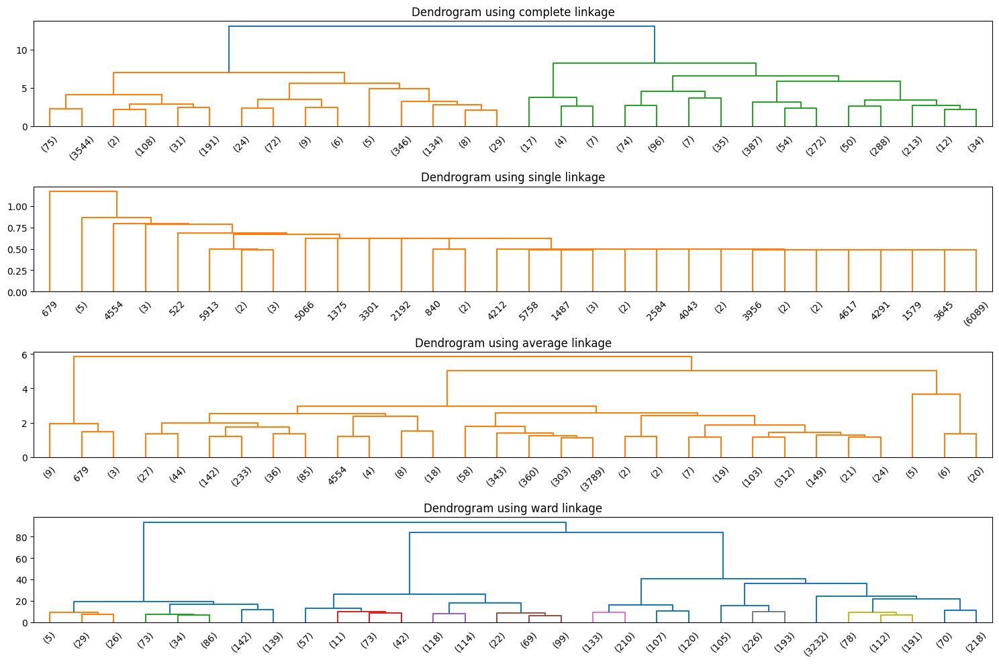

In [215]:
# Calculate distances and build dendrograms for Standardized data
plot_dendogram(data_wh_standard)

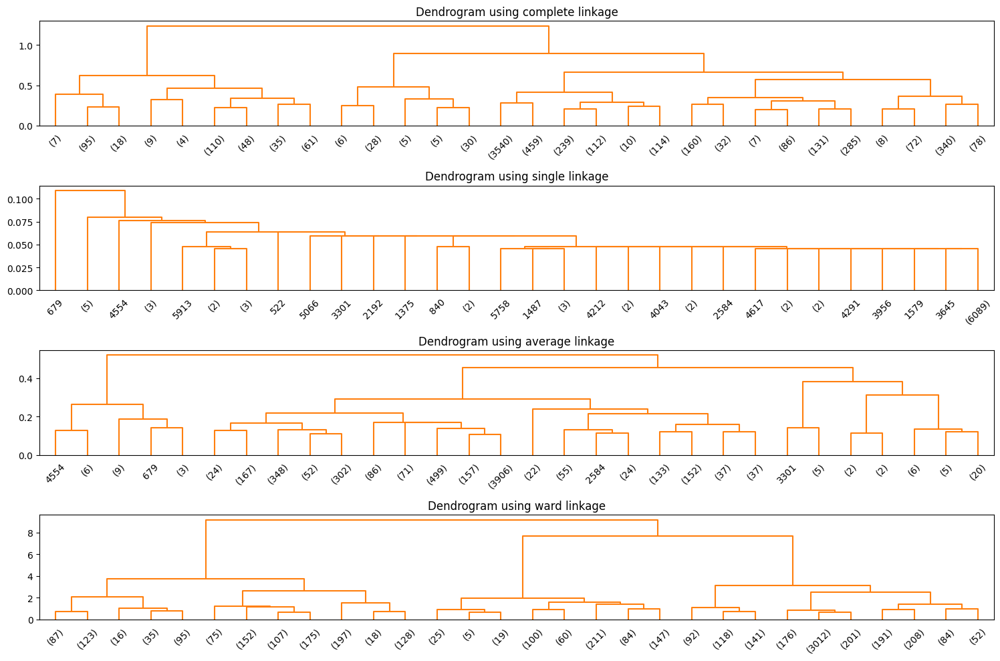

In [216]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendogram(data_wh_minmax)

As we can see from this images, the complete linkage create clusters which are very well distincted.
The single linkage seems to group outliers or sparse points early, potentially masking the natural cluster structure.
For the average linkage dendrogram, the even spacing between the branches indicates that this method avoids both the over-segmentation of complete linkage and the chaining of single linkage.
And lastly for the ward linkage creates compacted and spherical clusters.


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.672199395263002
Cohesion: 12099.182620530479

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.6440399308281047
Cohesion: 11133.075306624993

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.44336157369438234
Cohesion: 8270.45859407639

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.6220621195695198
Cohesion: 4409.794619049974


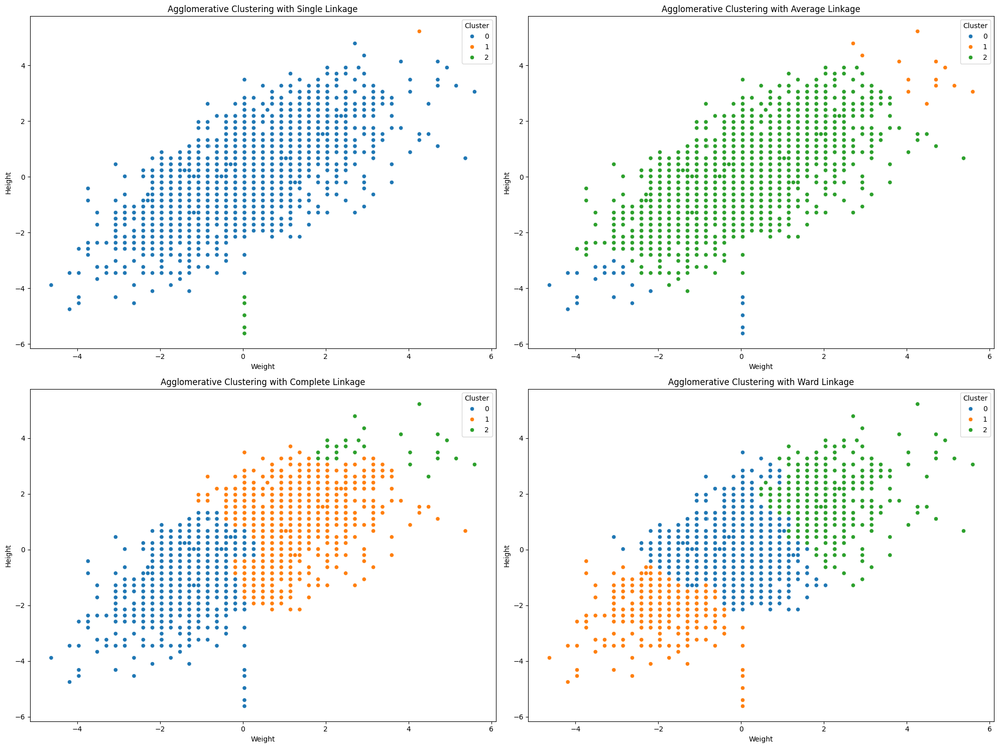

In [217]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_wh_standard, 'weight', 'height', n_clusters=3, xlabel='Weight', ylabel='Height')

We see that with single linkage the clustering doesn't quite work. more specifically it separets from the main cluster only the more distant values.
Similarly the average with some more values as the opposing clusters.

Complete and ward linkage instead gives us 3 cluster well defined. it's relevant to notice that with complete linkage in this case the line between clusters is not so well defined in case of the green and blue clusters. Instead with ward both clusters appear to have a well defined line that separetes them


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6659479061427018
Cohesion: 109.43108993112281

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.6307635140792311
Cohesion: 98.71348920930521

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.5598969195015192
Cohesion: 69.67866023325556

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.5857967042828441
Cohesion: 39.46842403583349


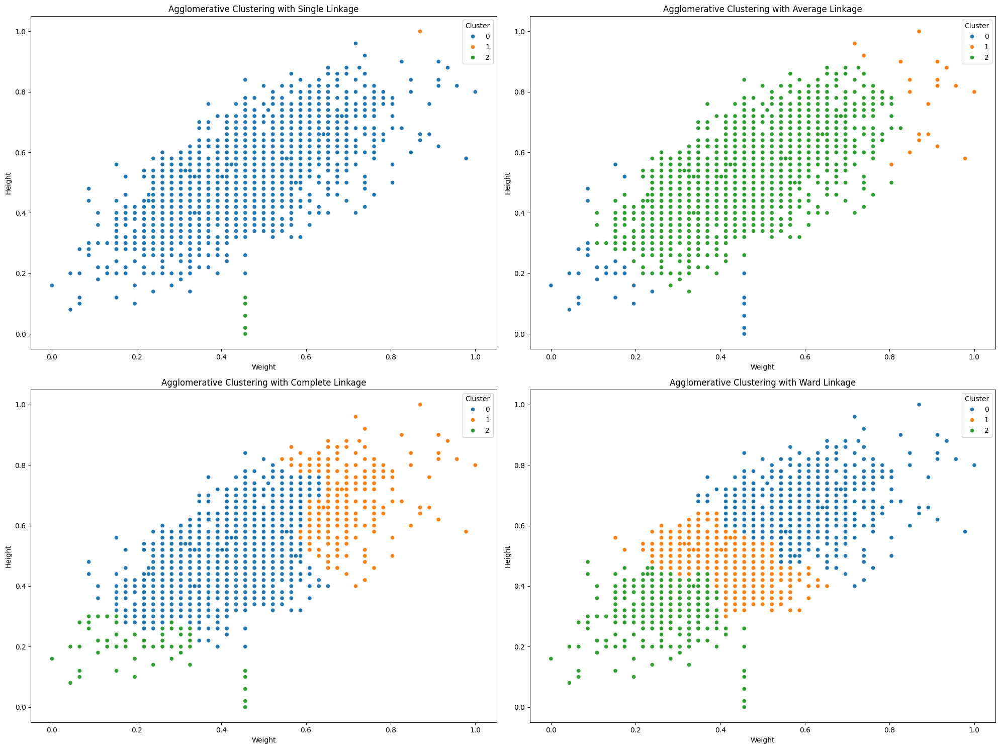

In [218]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_wh_minmax, 'weight', 'height', n_clusters=3, xlabel='Weight', ylabel='Height')


--- Standardized Data ---
Number of clusters: 3
Cluster 1: 926 points
Cluster 3: 526 points
Cluster 4: 4682 points
Silhouette Score: 0.2720366319053989
Cohesion: 7072.530233802065

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 1: 954 points
Cluster 3: 4334 points
Cluster 4: 846 points
Silhouette Score: 0.6323992811053814
Cohesion: 35.2823497744681


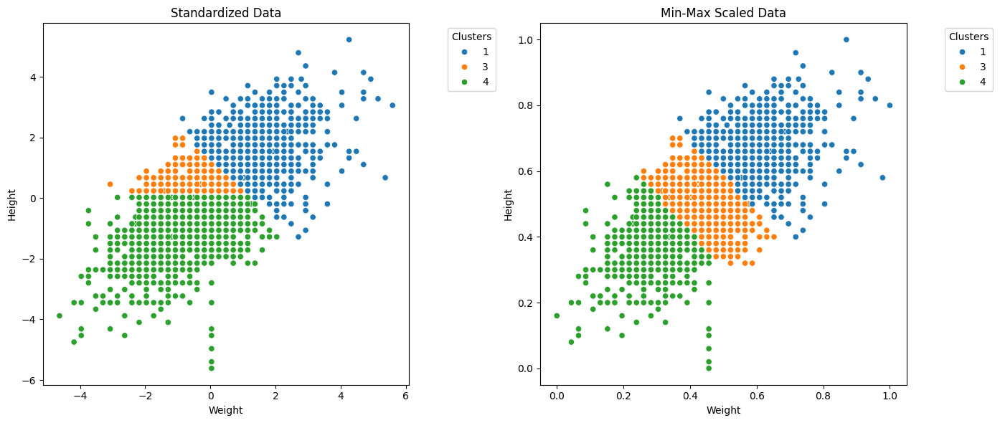

In [219]:
# Perform divisive clustering
analyze_and_plot_divisive(data_wh_standard.to_numpy(), data_wh_minmax.to_numpy(), 3, xlabel='Weight', ylabel='Height')

The algorithm finds these three clusters that are very near to the K-means clustering separation.

### 2. Applying Hierarchical clustering to *avg_position* and *bmi*.

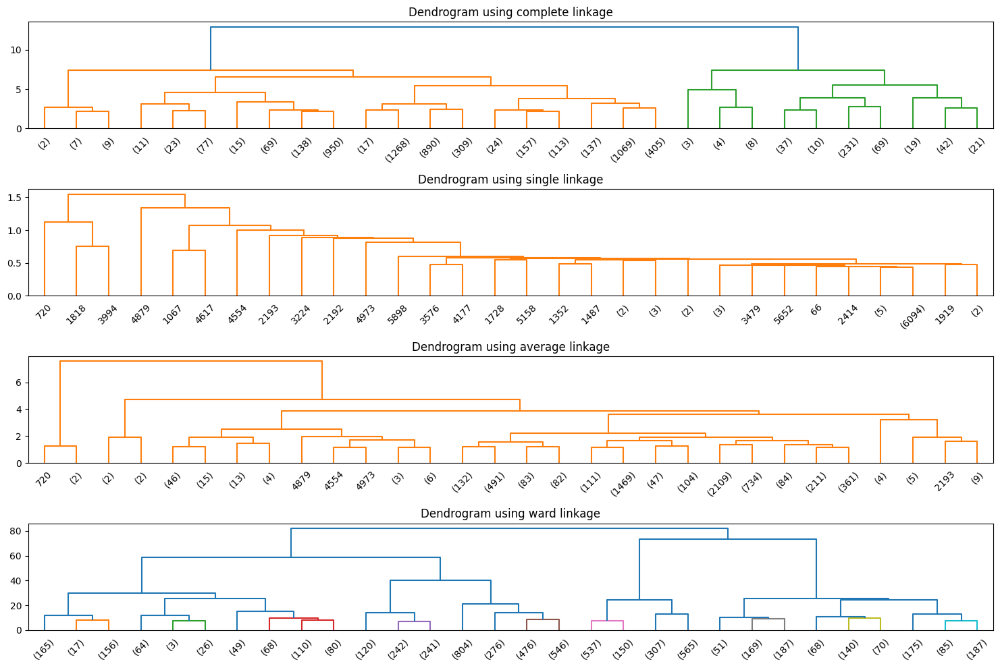

In [220]:
# Calculate distances and build dendrograms for Standardized data
plot_dendogram(data_bap_standard)

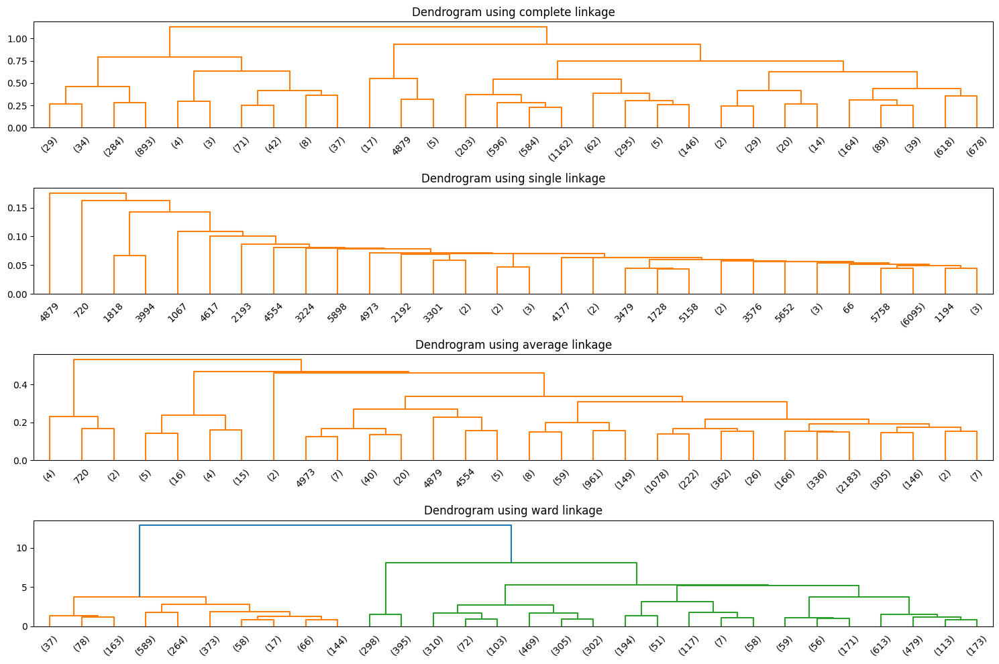

In [221]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendogram(data_bap_minmax)

The complete linkage dendrogram for bmi and position behave in similar but slighlty different way in respect to de wheigh and height dendrogram. The height of the branch now is different. Even single linkage behaves differently having a lot of disntance between values. Ward is more compact


--- Single Linkage ---
Number of clusters: 4
Silhouette Score: 0.7185074230065841
Cohesion: 12060.516534655048

--- Average Linkage ---
Number of clusters: 4
Silhouette Score: 0.5127740853794156
Cohesion: 10853.093868081092

--- Complete Linkage ---
Number of clusters: 4
Silhouette Score: 0.3593704725035835
Cohesion: 9510.540388438392

--- Ward Linkage ---
Number of clusters: 4
Silhouette Score: 0.39116122156879934
Cohesion: 4485.129017906435


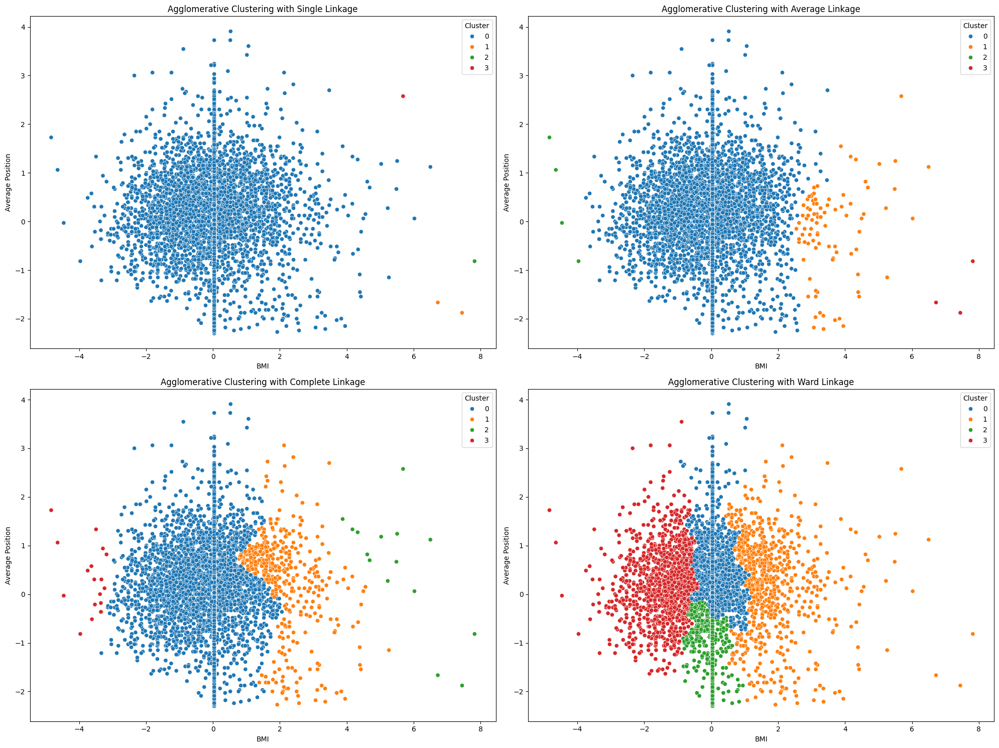

In [222]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_bap_standard, 'bmi', 'avg_position', n_clusters=4, xlabel='BMI', ylabel='Average Position')

As before we have a main cluster for single linkage with a couple of points that creates the other 2 clusters,obviously this is not a good clustering so we try with complete linkage. Complete linkage distribute for rows the dataset. even ward does exactly this but it reduce the central cluster.


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6144475814921738
Cohesion: 196.56041371844842

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.4471471399517442
Cohesion: 187.6253552873584

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.3779698126299732
Cohesion: 118.12658699316091

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.325901439732087
Cohesion: 81.32621818476986


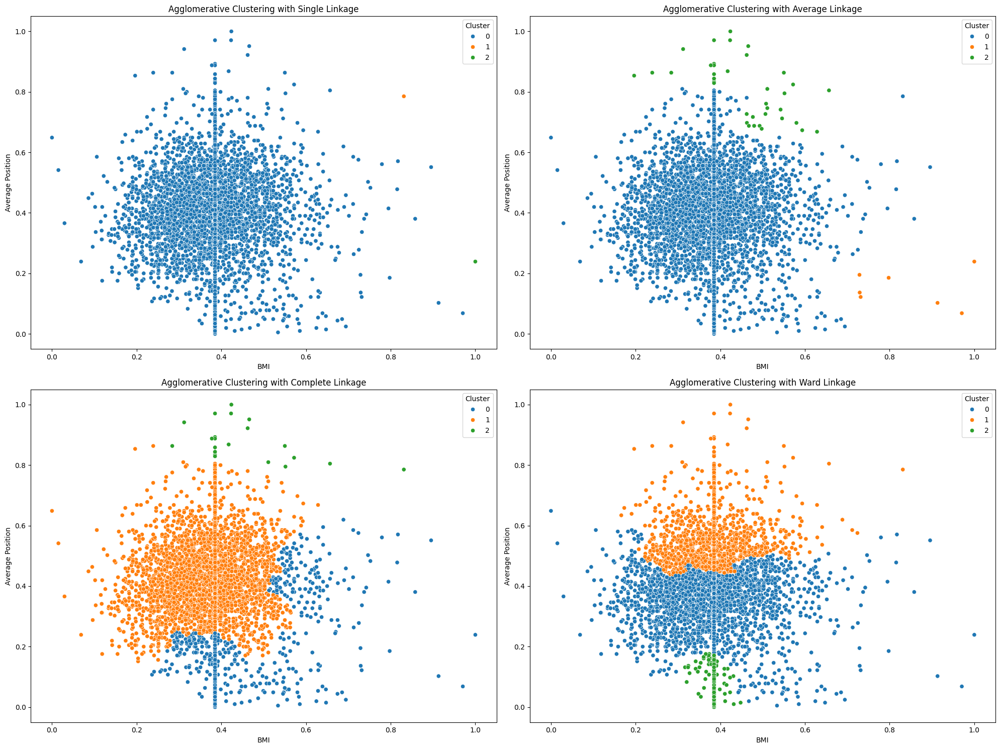

In [223]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_bap_minmax, 'bmi', 'avg_position', n_clusters=3, xlabel='BMI', ylabel='Average Position')


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 2705 points
Cluster 3: 2696 points
Cluster 4: 733 points
Silhouette Score: 0.30117504280099133
Cohesion: 6865.545696963566

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 2493 points
Cluster 3: 2486 points
Cluster 4: 1155 points
Silhouette Score: 0.358054002266929
Cohesion: 72.74836143648164


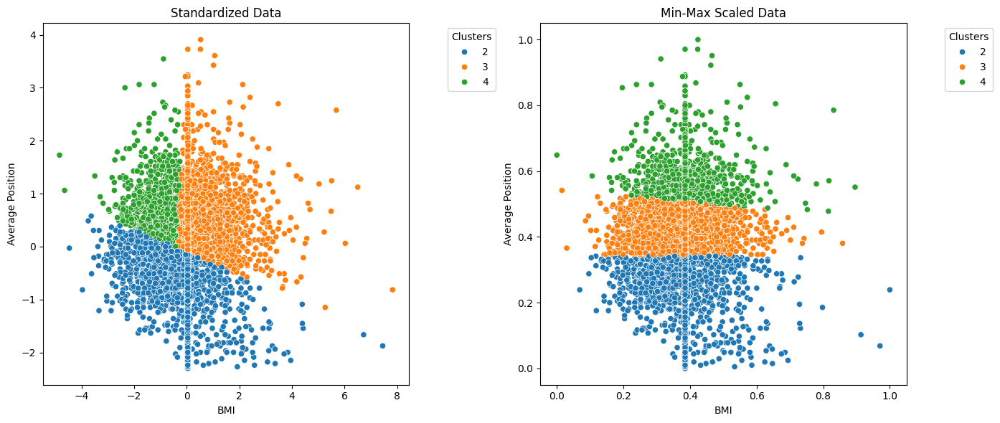

In [224]:
# Perform divisive clustering
analyze_and_plot_divisive(data_bap_standard.to_numpy(), data_bap_minmax.to_numpy(), 3, xlabel='BMI', ylabel='Average Position')

With the divisive we now see that the result is very close to the ward from before. it distributes in rows the dataset.

### 3. Applying Hierarchical clustering to *avg_delta* and *avg_position*.

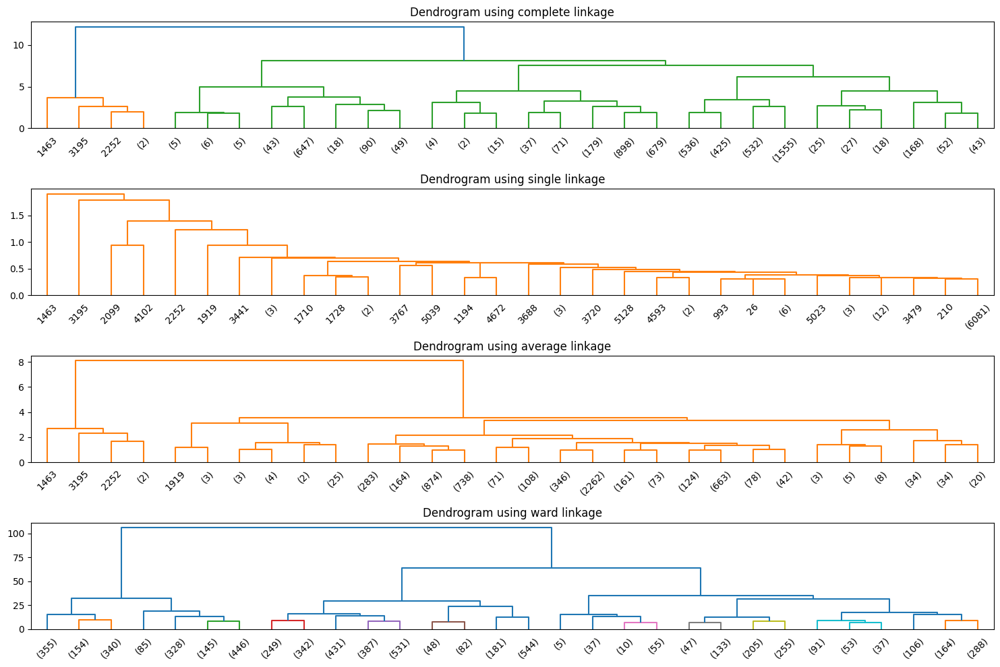

In [225]:
# Calculate distances and build dendrograms for Standardized data
plot_dendogram(data_adap_standard)

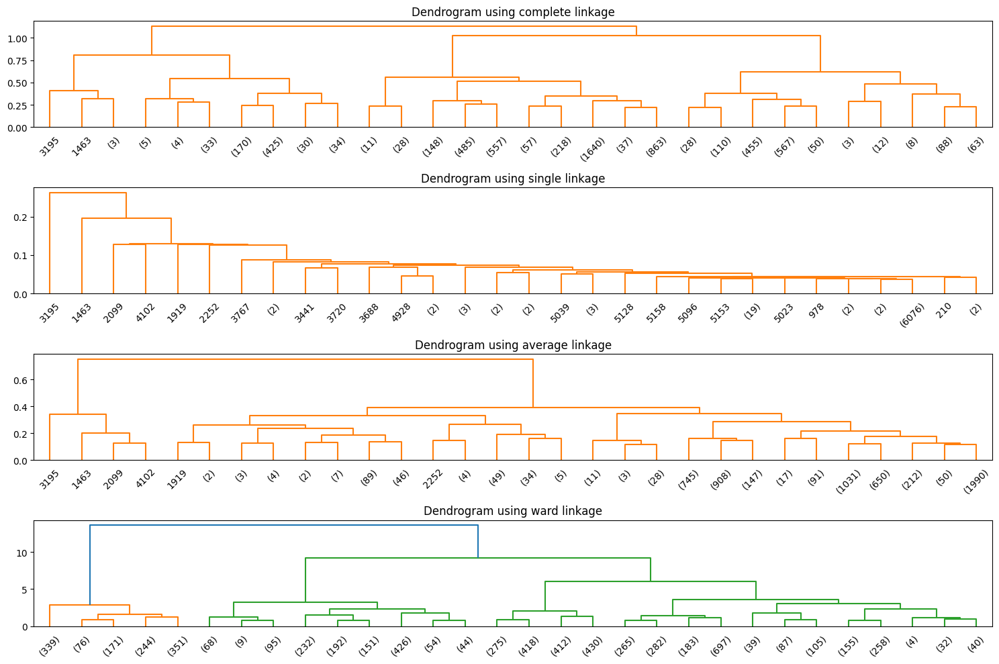

In [226]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendogram(data_adap_minmax)

With single linkage we notice that a part of the dataset is very close and very similar, the other part instead is more sparce and distant.
Ward rimain similar as before having very compact clusters. 
Average linkage is closer to single linkage in respect to those showed before. we can see that by looking at how compact and close the height of the branches are


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.7740182051416371
Cohesion: 12111.176359565974

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.488615242950774
Cohesion: 11548.488257175712

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.3387015089334172
Cohesion: 8625.30904981182

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.35455334396292276
Cohesion: 4615.761299030369


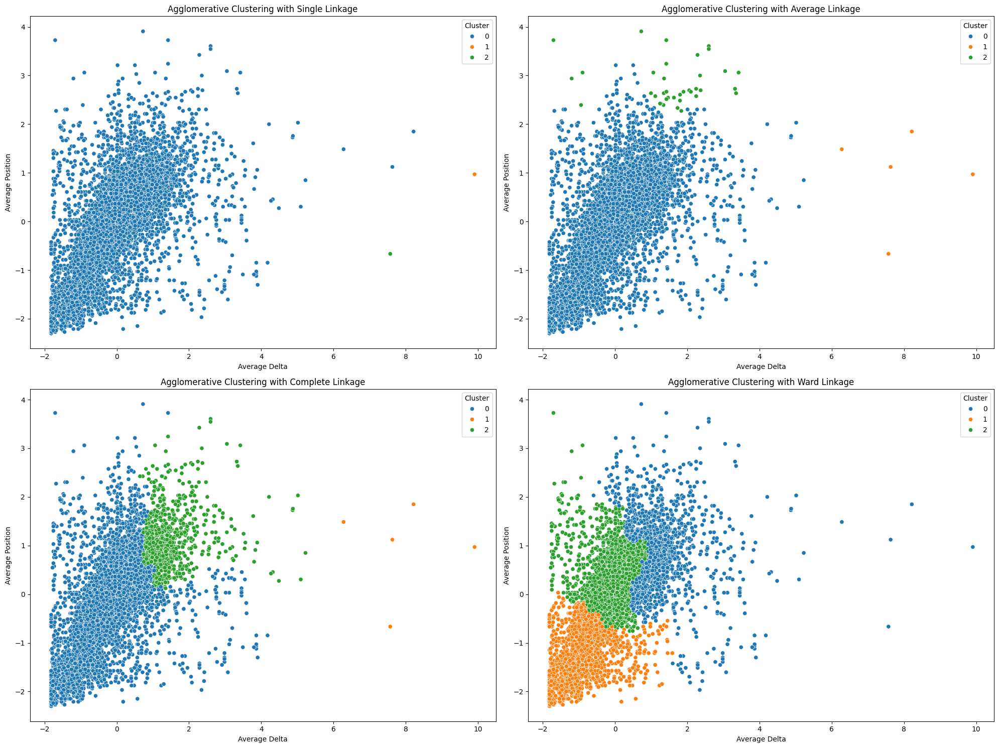

In [227]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_adap_standard, 'avg_delta', 'avg_position', n_clusters=3, xlabel='Average Delta', ylabel='Average Position')

As before the single linkage creates a main cluster and for the other 2 it puts only a few elements in there. As note in the previous annotation, Average linkage is very close to single linkage in this case. From complete and ward we observe that it separetes in column the data with the ward being better in dividing. 


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6777942652591094
Cohesion: 202.52450906720503

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.43268900103273283
Cohesion: 174.66658963647248

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.3057971337112965
Cohesion: 97.302684866056

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.3679619894425646
Cohesion: 69.59818387216372


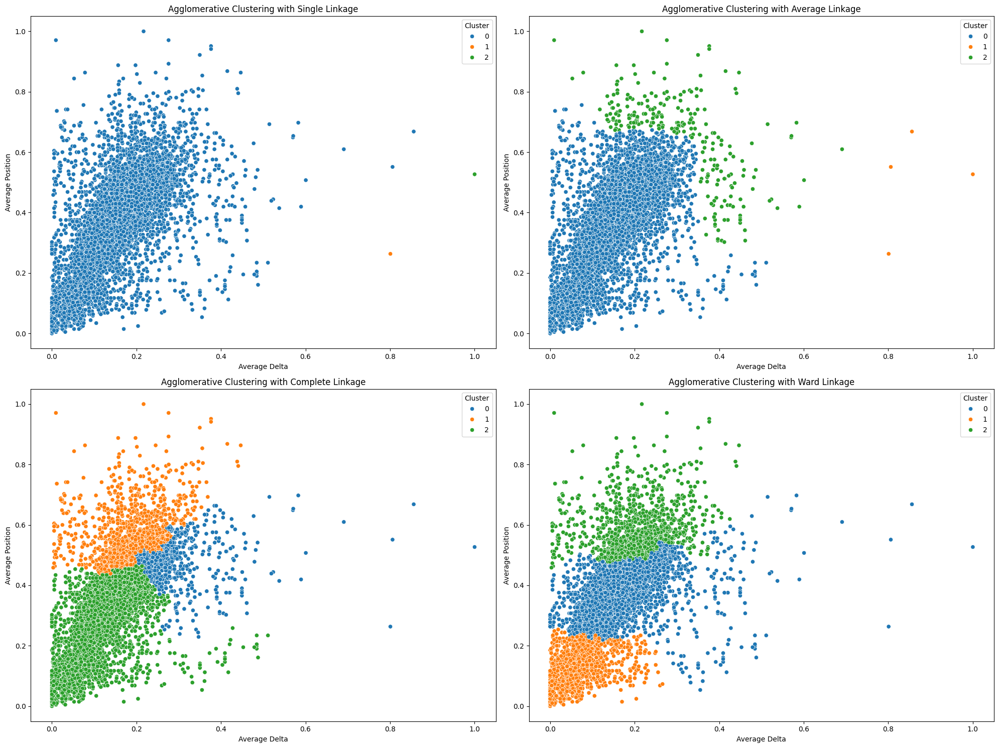

In [228]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_adap_minmax, 'avg_delta', 'avg_position', n_clusters=3, xlabel='Average Delta', ylabel='Average Position')


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 2784 points
Cluster 3: 969 points
Cluster 4: 2381 points
Silhouette Score: 0.3639379123521799
Cohesion: 4714.099154335342

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 2622 points
Cluster 3: 1141 points
Cluster 4: 2371 points
Silhouette Score: 0.38062861087204564
Cohesion: 66.10181292594136


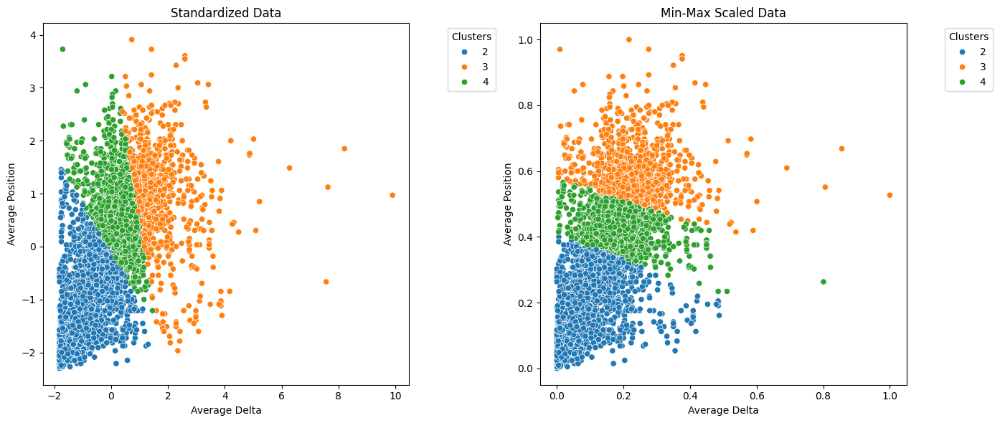

In [229]:
# Perform divisive clustering
analyze_and_plot_divisive(data_adap_standard.to_numpy(), data_adap_minmax.to_numpy(), 3, xlabel='Average Delta', ylabel='Average Position')

Exactly as before this divisive method is very close to the ward.

### 4. Applying Hierarchical clustering to *points* and *race_intensity*.

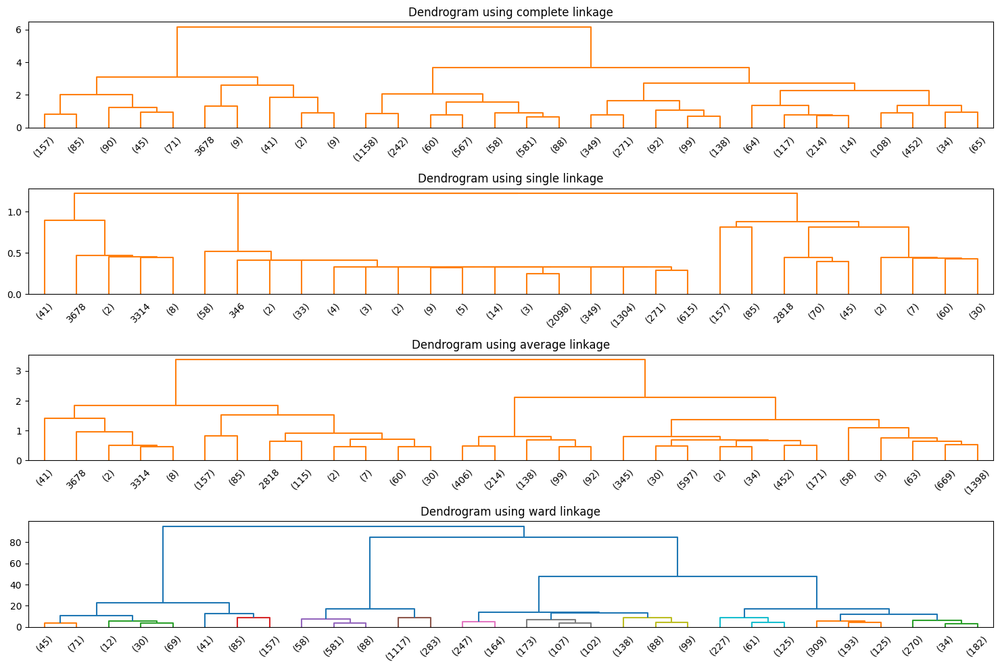

In [230]:
# Calculate distances and build dendrograms for Standardized data
plot_dendogram(data_pri_standard)

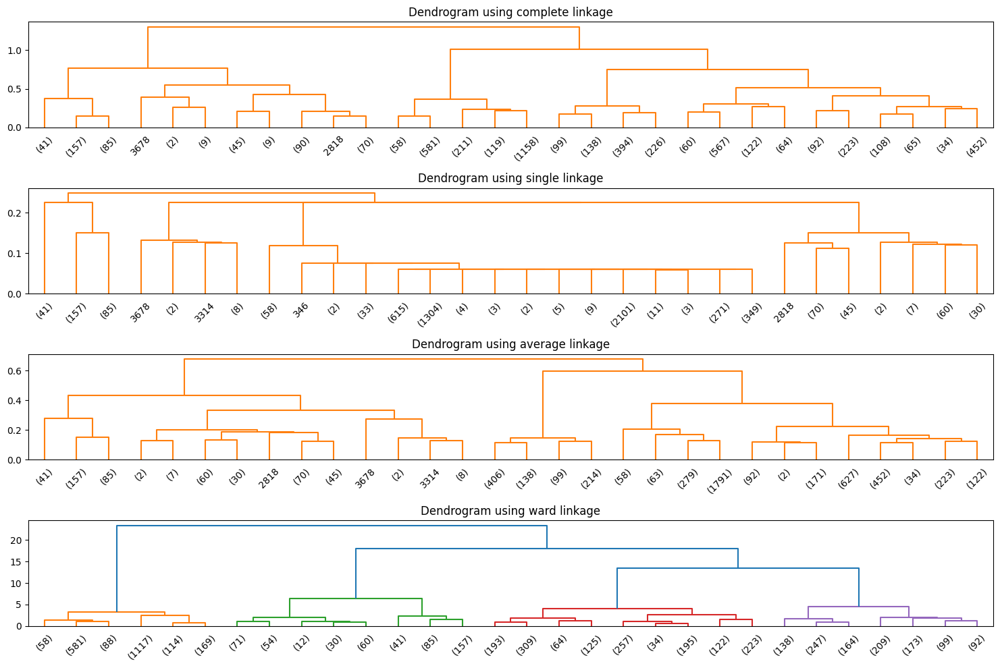

In [231]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendogram(data_pri_minmax)

From this dendograms we already see that the data is very close in differents clusters


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.5901958499161968
Cohesion: 5904.014666067222

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.551181710437389
Cohesion: 2841.0971095522264

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.555274203218169
Cohesion: 2406.34488957159

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.5750548487735041
Cohesion: 2427.315333761596


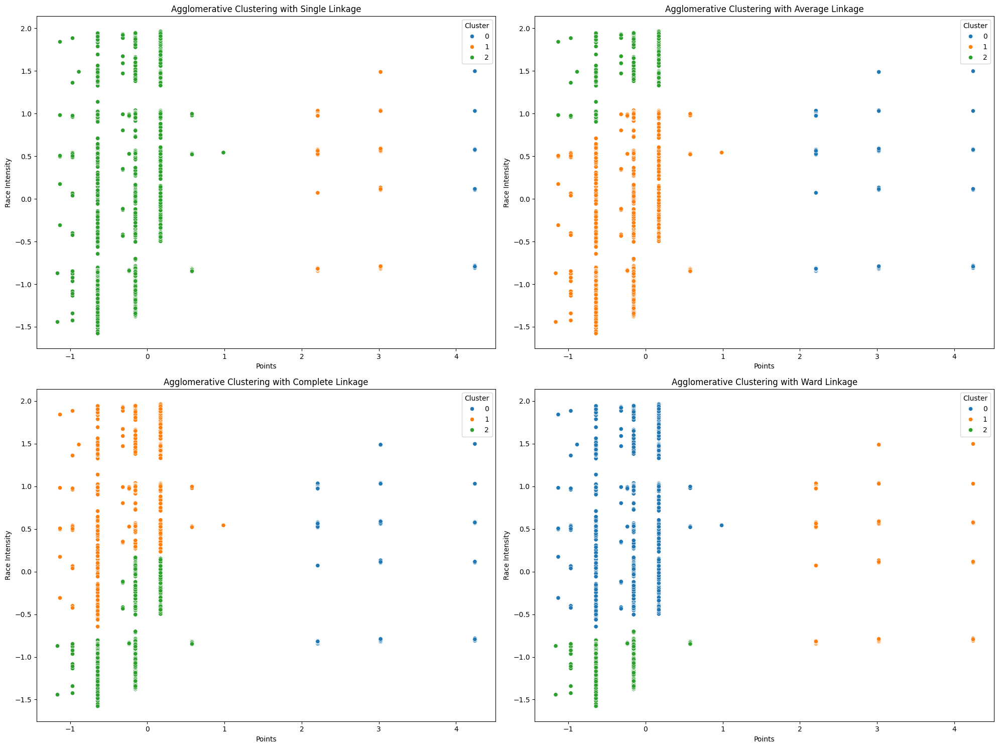

In [232]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_pri_standard, 'points','race_intensity', n_clusters=3, xlabel='Points', ylabel='Race Intensity')

Since the data is well separeted in columns all of this methods are actually quite good, we notice that complete and ward are exactly the same and also single and average linkage are the same.


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.4662497357266833
Cohesion: 488.2343520212255

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.5503401599210144
Cohesion: 201.24818741370194

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.5921203010071237
Cohesion: 162.90649498088771

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.5921203010071237
Cohesion: 162.90649498088774


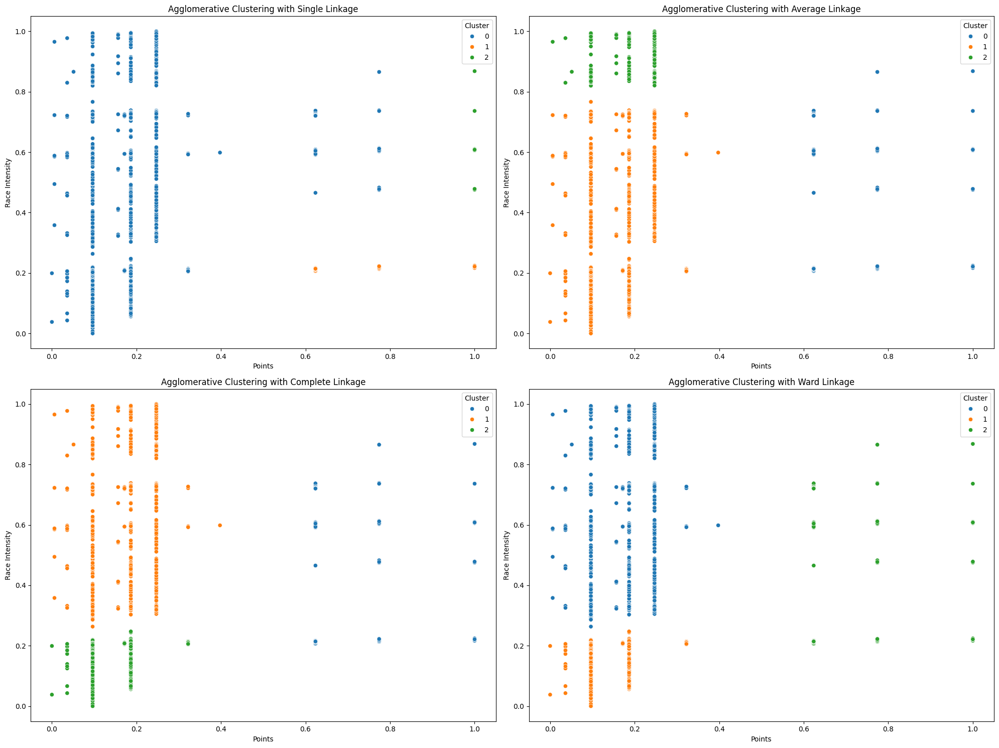

In [233]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_pri_minmax, 'points','race_intensity', n_clusters=3, xlabel='Points', ylabel='Race Intensity')


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 2060 points
Cluster 3: 2938 points
Cluster 4: 283 points
Silhouette Score: 0.5254713632997978
Cohesion: 3667.3962740950874

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 2630 points
Cluster 3: 2368 points
Cluster 4: 283 points
Silhouette Score: 0.5666431751722542
Cohesion: 187.3826835439923


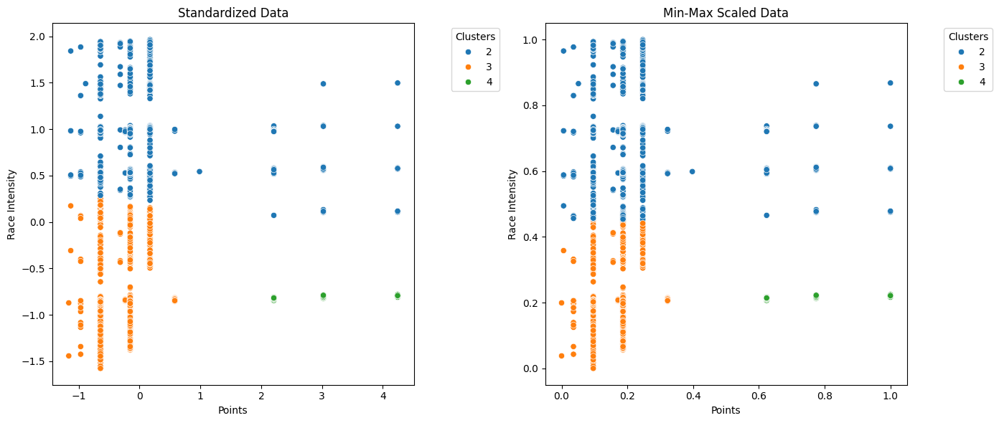

In [234]:
# Perform divisive clustering
analyze_and_plot_divisive(data_pri_standard.to_numpy(), data_pri_minmax.to_numpy(), 3, xlabel='Points', ylabel='Race Intensity')

Again divisive is the same as ward and also to Complete average

### 5. Applying Hierarchical clustering to *points* and *startlist_quality*.

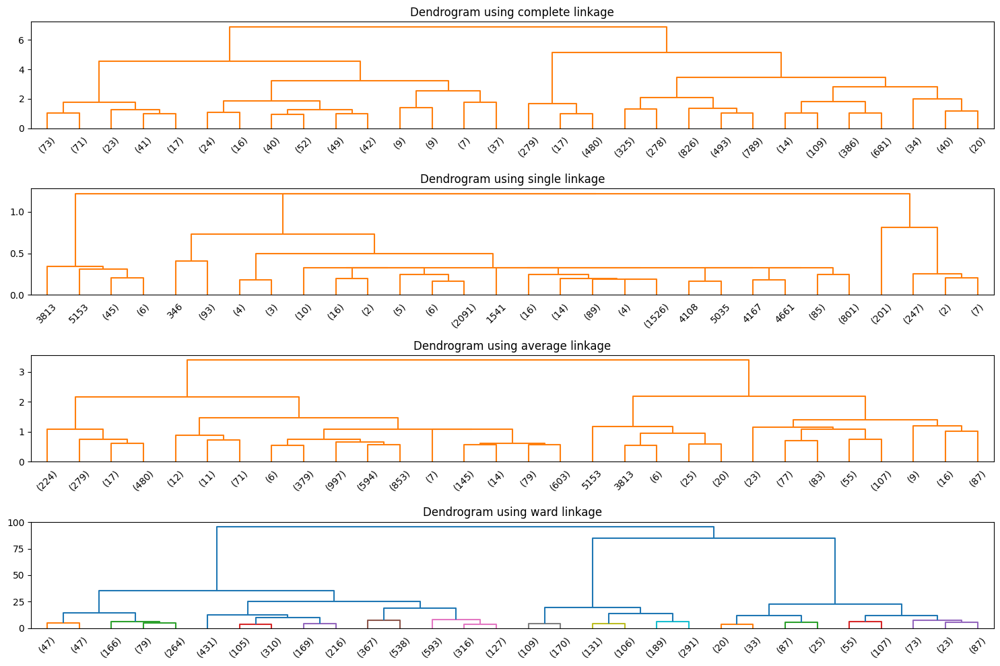

In [235]:
# Calculate distances and build dendrograms for Standardized data
plot_dendogram(data_psq_standard)

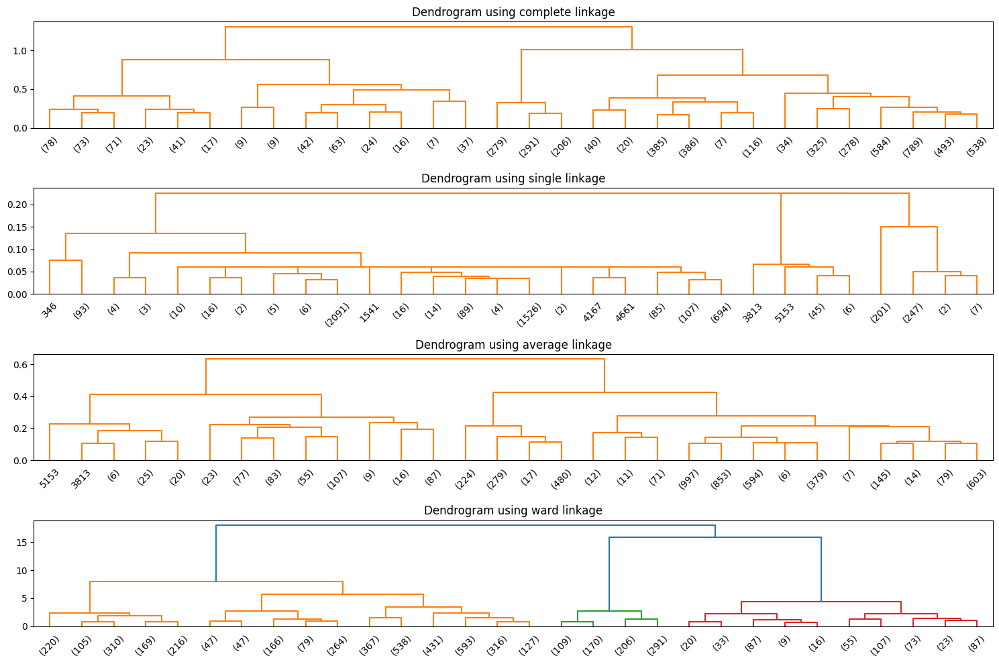

In [236]:
# Calculate distances and build dendrograms for Min-Max Scaled data
plot_dendogram(data_psq_minmax)

As we can see from these dendograms the branches are more similar overall. it appears to have not so distant elements nor that similar. it creates quite well separeted some groups with the close values.


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.6114740312281586
Cohesion: 5830.275646734521

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.6114740312281586
Cohesion: 5830.275646734521

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.6304009495610361
Cohesion: 2587.0620861729108

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.6263786077371063
Cohesion: 2416.2141044297564


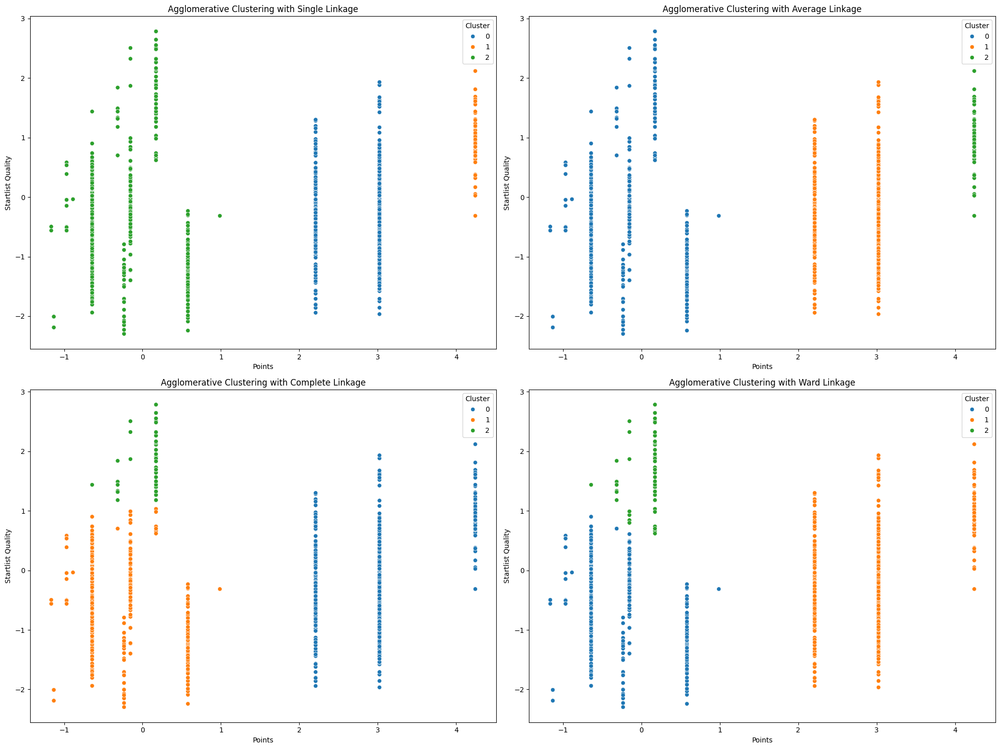

In [237]:
# Analyze and plot hierarchical clustering results for Standardized Scaled data
analyze_and_plot_hierarchical(data_psq_standard, 'points','startlist_quality', n_clusters=3, xlabel='Points', ylabel='Startlist Quality')

As always the single linkage uses sparse data to build the second and third cluster while having the main cluster contains almost the whole collection of elements.
With average the situation is quite different than before since it starts behaving by dividing in rows the clusters.
Same with complete and ward linkage, but linkage leave more margin for the cluster in the middle


--- Single Linkage ---
Number of clusters: 3
Silhouette Score: 0.5959841338030583
Cohesion: 223.08114001524737

--- Average Linkage ---
Number of clusters: 3
Silhouette Score: 0.6263544454835613
Cohesion: 91.23888133007398

--- Complete Linkage ---
Number of clusters: 3
Silhouette Score: 0.6310604479492407
Cohesion: 97.69974999701812

--- Ward Linkage ---
Number of clusters: 3
Silhouette Score: 0.6310604479492407
Cohesion: 97.69974999701812


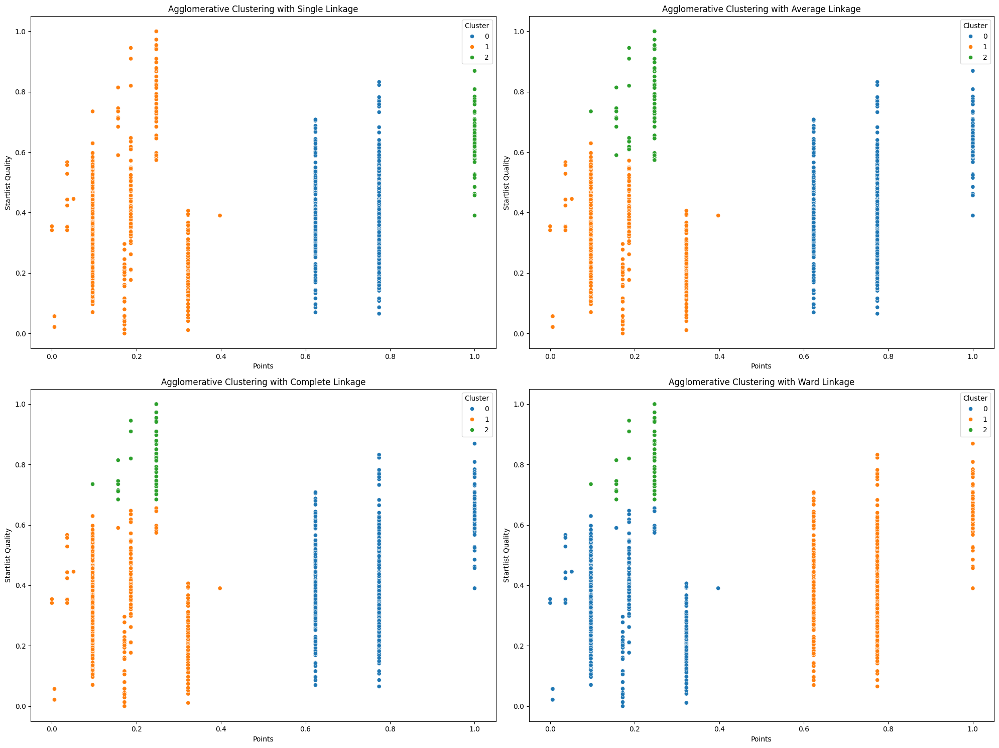

In [238]:
# Analyze and plot hierarchical clustering results for Min-Max Scaled data
analyze_and_plot_hierarchical(data_psq_minmax, 'points','startlist_quality', n_clusters=3, xlabel='Points', ylabel='Startlist Quality')


--- Standardized Data ---
Number of clusters: 3
Cluster 2: 1478 points
Cluster 3: 2420 points
Cluster 4: 1383 points
Silhouette Score: 0.3694997697557401
Cohesion: 5168.218766850549

--- Min-Max Scaled Data ---
Number of clusters: 3
Cluster 2: 1490 points
Cluster 3: 1368 points
Cluster 4: 2423 points
Silhouette Score: 0.3752801758162034
Cohesion: 186.91386728391169


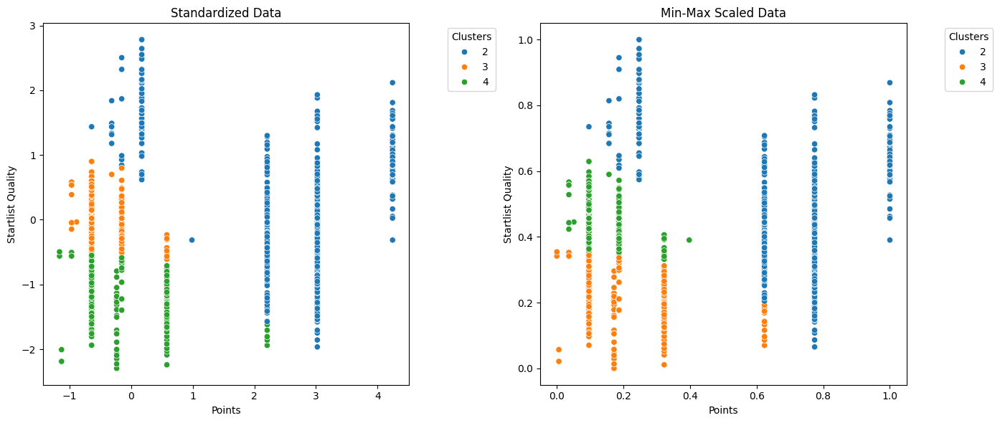

In [239]:
# Perform divisive clustering
analyze_and_plot_divisive(data_psq_standard.to_numpy(), data_psq_minmax.to_numpy(), 3, xlabel='Points', ylabel='Startlist Quality')

The divisive also this time works quite well having the almost the same result as the complete linkage

## Additional Clusterings


### OPTICS Clustering

OPTICS (Ordering Points To Identify the Clustering Structure) is a density-based clustering algorithm. It is designed to identify clusters of varying densities in a dataset by analyzing the density-reachability of points.

For each point, the algorithm calculates the *core distance*, which is the minimum distance needed to consider that point as a core point, given a certain **radius** parameter. The *reachability distance* (**neighbors**) of a point is the distance needed to reach it from a core point. This helps determine how reachable a point is from others in its vicinity. OPTICS processes all points in the dataset and orders them based on reachability distance, which helps create a structure for visualizing the clustering. This ordering enables the detection of clusters at different density levels. By analyzing the reachability plot, clusters are identified as valleys (low-reachability regions), while noise points and outliers are detected as those with high reachability distances.

OPTICS is especially useful for identifying clusters with different shapes and densities, making it more flexible than DBSCAN for complex datasets.

In [89]:
def analyze_and_plot_optics(data1, data2, radius, min_neighbors, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side OPTICS clustering results for two datasets.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param radius: Maximum distance to consider points in the same cluster (Array of 2 floats)
    :param min_neighbors: Minimum number of points to form a cluster (Array of 2 integers)
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles=["OPTICS Clustering - Standardized Data", "OPTICS Clustering - Min-Max Scaled Data"]

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns

    for i, (data, rad, min_neig, title, ax) in enumerate(zip([data1, data2], radius, min_neighbors, titles, axes)):
        # Initialize and process OPTICS
        optics_instance = optics(data.tolist(), rad, min_neig)
        _, result = timedcall(optics_instance.process)

        # Extract clusters and noise
        clusters = optics_instance.get_clusters()
        noise = optics_instance.get_noise()

        # Prepare labels for silhouette score
        labels = np.full(data.shape[0], -1)  # Start with all noise (-1)
        for cluster_id, cluster_points in enumerate(clusters):
            labels[cluster_points] = cluster_id

        # Metrics Calculation
        num_clusters = len(clusters)
        if num_clusters > 1:
            silhouette = silhouette_score(data, labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(len(cluster) for cluster in clusters)

        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print("Cluster Analysis:")
        for cluster_id, cluster in enumerate(clusters):
            print(f"Cluster {cluster_id}: {len(cluster)} points")
        print(f"Noise: {len(noise)} points")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion (Total Points in Clusters): {cohesion}")

        # Visualization
        colors = sns.color_palette("tab10", len(clusters) + 1)
        for cluster_id, cluster_points in enumerate(clusters):
            cluster_data = data[np.array(cluster_points, dtype=int)]
            ax.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id])

        # Plot noise points
        noise_data = data[np.array(noise, dtype=int)]
        ax.scatter(noise_data[:, 0], noise_data[:, 1], color='red', marker='x', label='Noise')

        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

### 1. Applyting OPTICS to *weight* and *height*

The plot shows a single large cluster with some noisy values scattered around, as expected. The radius and neighbors parameters were chosen specifically to highlight these noisy values.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6063 points
Noise: 71 points
Silhouette Score: Not defined
Cohesion (Total Points in Clusters): 6063

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6068 points
Noise: 66 points
Silhouette Score: Not defined
Cohesion (Total Points in Clusters): 6068


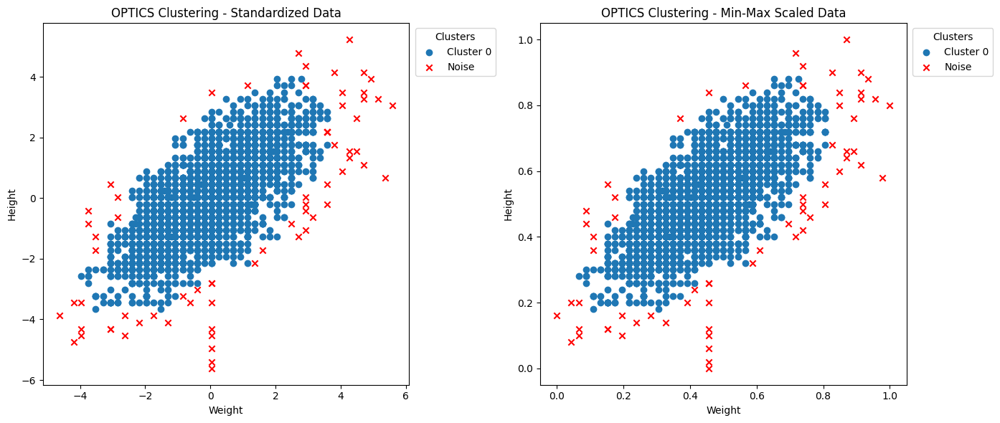

In [ ]:
# Normalize the 'weight' and 'height' columns
data_wh_standard, data_wh_minmax = normalize_data(cyclists[['weight', 'height']], ['weight', 'height'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_wh_standard.values, data_wh_minmax.values, radius, neighbors, 'Weight', 'Height')


### 2. Applyting OPTICS to *bmi* and *avg_position*

For the *bmi* and *position* we decide to use the same *radius* and *neighbors* values used before.

The results showed consist another time in a single large cluster with some noisy values.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6075 points
Cluster 1: 6 points
Noise: 53 points
Silhouette Score: 0.5500083047847857
Cohesion (Total Points in Clusters): 6081

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6063 points
Cluster 1: 4 points
Cluster 2: 2 points
Noise: 65 points
Silhouette Score: 0.24186220862688668
Cohesion (Total Points in Clusters): 6069


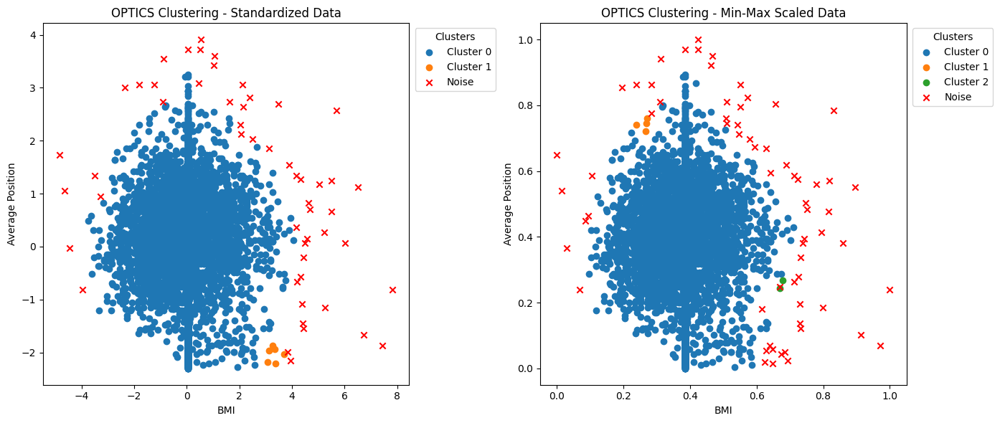

In [242]:
# Normalize the 'bmi' and 'avg_position' columns
data_bap_standard, data_bap_minmax = normalize_data(cyclists[['bmi', 'avg_position']], ['bmi', 'avg_position'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_bap_standard.values, data_bap_minmax.values, radius, neighbors, 'BMI', 'Average Position')

### 3. Applying OPTICS to *avg_delta* and *avg_position*.

In the *avg_delta* and *avg_position* case we use a *radius*=20 and *neighbors*=5 to better highlight the noise.

This time, we can observe distinct clusters. Cluster 0 still contains the majority of the values, but we also notice a significant number of noisy values.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6105 points
Noise: 29 points
Silhouette Score: Not defined
Cohesion (Total Points in Clusters): 6105

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6071 points
Cluster 1: 10 points
Cluster 2: 9 points
Noise: 44 points
Silhouette Score: 0.38369509807169416
Cohesion (Total Points in Clusters): 6090


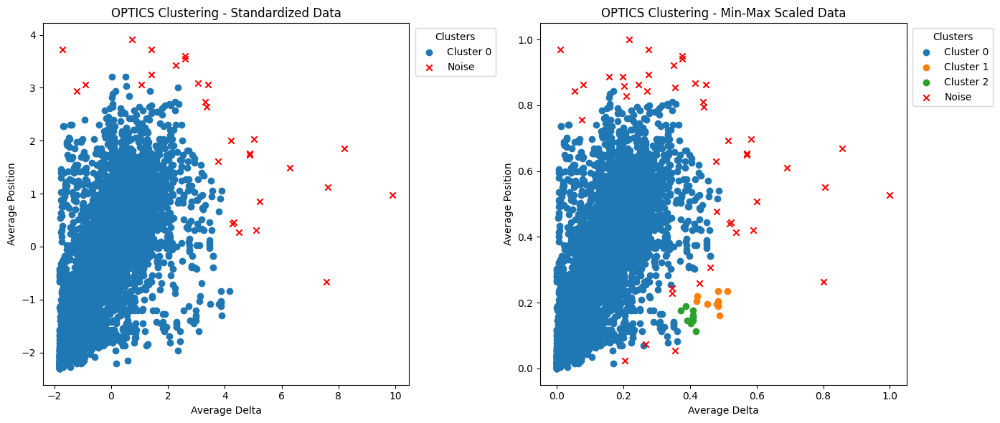

In [243]:
# Normalize the 'avg_delta' and 'avg_position' columns
data_adap_standard, data_adap_minmax = normalize_data(cyclists[['avg_delta', 'avg_position']], ['avg_delta', 'avg_position'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_adap_standard.values, data_adap_minmax.values, radius, neighbors, 'Average Delta', 'Average Position')

### 4. Applying OPTICS to *points* and *race_intensity*.

Using the same *radius* and *neighbors* from the first one we can see eleven clusters well-defined with very few noisy values.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 4677 points
Cluster 1: 157 points
Cluster 2: 115 points
Cluster 3: 33 points
Cluster 4: 30 points
Cluster 5: 41 points
Cluster 6: 85 points
Cluster 7: 58 points
Cluster 8: 60 points
Cluster 9: 8 points
Cluster 10: 7 points
Noise: 10 points
Silhouette Score: -0.030956617436640972
Cohesion (Total Points in Clusters): 5271

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 615 points
Cluster 1: 349 points
Cluster 2: 1386 points
Cluster 3: 271 points
Cluster 4: 392 points
Cluster 5: 136 points
Cluster 6: 157 points
Cluster 7: 88 points
Cluster 8: 669 points
Cluster 9: 527 points
Cluster 10: 45 points
Cluster 11: 108 points
Cluster 12: 33 points
Cluster 13: 30 points
Cluster 14: 96 points
Cluster 15: 9 points
Cluster 16: 41 points
Cluster 17: 70 points
Cluster 18: 85 points
Cluster 19: 58 points
Cluster 20: 9 points
Cluster 21: 60 points
Cluster 22: 8 points
Cluster 23: 7 points
Noise: 32 

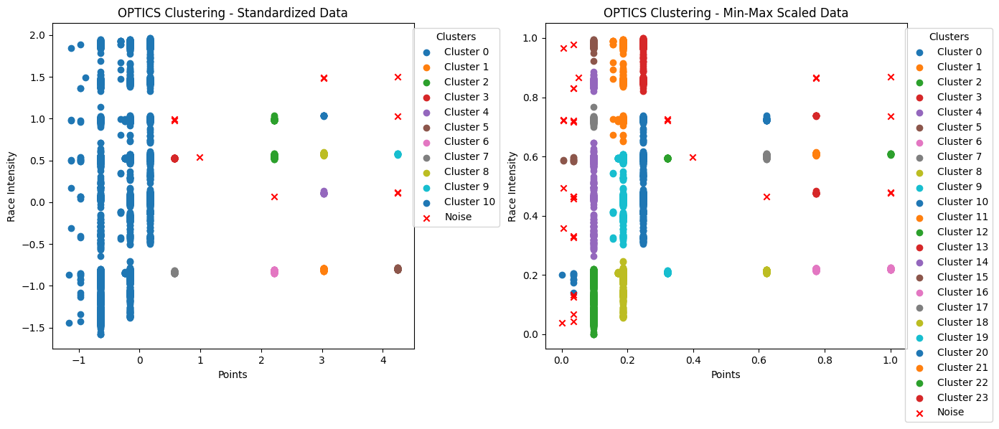

In [244]:
# Normalize the 'points' and 'race_intensity' columns
data_pri_standard, data_pri_minmax = normalize_data(races.drop_duplicates(subset='_url')[['points', 'race_intensity']], ['points','race_intensity'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_pri_standard.values, data_pri_minmax.values, radius, neighbors, xlabel='Points', ylabel='Race Intensity')


### 5. Applying OPTICS to *points* and *startlist_quality*.

To conclude the OPTICS clustering we compute that on *points* and *startlist_quality* with a *radius*=60 and *neighbors*=10.

The clusters appear to be well-defined. Cluster 0 remains the largest, and this time the noisy values are concentrated at the lower and higher ends of *startlist_quality* for each cluster.


--- OPTICS Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 4670 points
Cluster 1: 256 points
Cluster 2: 7 points
Cluster 3: 201 points
Cluster 4: 93 points
Cluster 5: 53 points
Noise: 1 points
Silhouette Score: 0.2048948110605368
Cohesion (Total Points in Clusters): 5280

--- OPTICS Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 85 points
Cluster 1: 1633 points
Cluster 2: 801 points
Cluster 3: 2097 points
Cluster 4: 246 points
Cluster 5: 7 points
Cluster 6: 201 points
Cluster 7: 93 points
Cluster 8: 45 points
Cluster 9: 18 points
Cluster 10: 10 points
Cluster 11: 16 points
Cluster 12: 6 points
Noise: 23 points
Silhouette Score: 0.05864561367367573
Cohesion (Total Points in Clusters): 5258


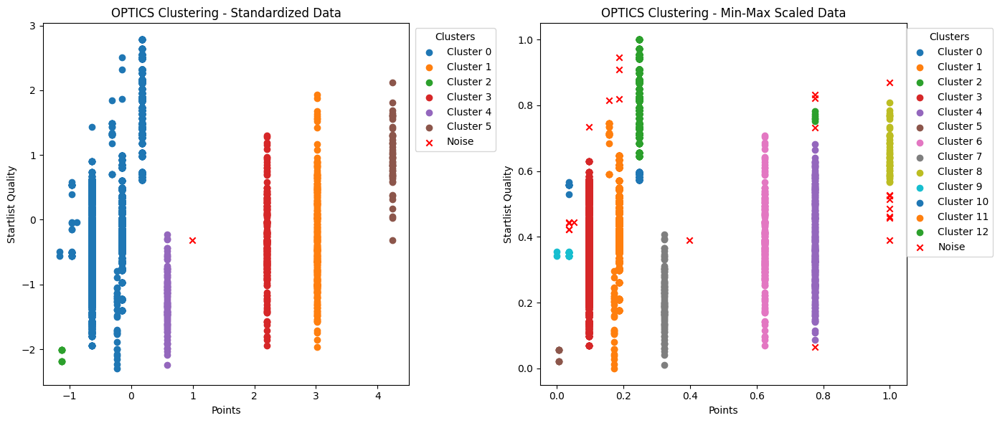

In [245]:
# Normalize the 'points' and 'startlist_quality' columns
data_psq_standard, data_psq_minmax = normalize_data(races.drop_duplicates(subset='_url')[['points', 'startlist_quality']], ['points','startlist_quality'])

# OPTICS algorithm parameters
radius = [0.4, 0.04]  # Maximum distance to consider points in the same cluster
neighbors = [5,5]  # Minimum number of points to form a cluster

# Apply OPTICS clustering to the data
analyze_and_plot_optics(data_psq_standard.values, data_psq_minmax.values, radius, neighbors, xlabel='Points', ylabel='Startlist Quality')

### CURE Clustering

CURE (Clustering Using Representatives) is an advanced hierarchical clustering algorithm that is designed to handle large datasets and identify clusters of different shapes and sizes. 

CURE starts by taking a random sample of the dataset to reduce computational complexity. This sample is used to approximate the overall data distribution. Initially, each point in the sample is treated as an individual cluster. The algorithm iteratively merges clusters based on their closest pair of representative points, similar to hierarchical clustering. For each cluster, CURE selects a fixed number of well-scattered points (known as *representative points*). These points are used to better capture the shape and spread of the cluster. To avoid sensitivity to outliers and better represent the true cluster shape, the representative points are shrunk towards the cluster's centroid by a specified fraction. This step helps balance cluster compactness and variability.
The algorithm continues to merge clusters based on the minimum distance between their representative points until a stopping condition (like a predefined number of clusters) is met. The final output shows clusters that can capture non-spherical and irregular shapes more effectively than standard hierarchical or centroid-based methods.

CURE is particularly useful for detecting clusters of arbitrary shapes and handling outliers robustly, which is an advantage over traditional algorithms like k-means that assume spherical clusters.


In [60]:
def analyze_and_plot_cure(data1, data2, num_clusters, xlabel, ylabel):
    """
    Analyzes, computes metrics, and plots side-by-side CURE clustering results for two datasets.
    
    :param data1: First dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param data2: Second dataset (NumPy array or Pandas DataFrame with 2 columns)
    :param num_clusters: Number of clusters for the CURE algorithm
    :param xlabel: label for x axis
    :param ylabel: label for y axis
    """

    titles=["CURE Clustering - Standardized Data", "CURE Clustering - Min-Max Scaled Data"]


    fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # 1 row, 2 columns

    for i, (data, title, ax) in enumerate(zip([data1, data2], titles, axes)):
        # Convert data to a list of lists for CURE
        data_list = data.tolist()

        # Initialize and process CURE
        cure_instance = cure(data_list, num_clusters)
        cure_instance.process()

        # Extract clusters
        clusters = cure_instance.get_clusters()

        # Prepare labels for silhouette score
        labels = np.full(len(data_list), -1)  # Start with all noise (-1)
        for cluster_id, cluster_points in enumerate(clusters):
            for point_index in cluster_points:
                labels[point_index] = cluster_id

        # Metrics Calculation
        if len(clusters) > 1:
            silhouette = silhouette_score(data, labels, metric='euclidean')
        else:
            silhouette = None  # Not defined for 1 cluster or all noise

        cohesion = sum(len(cluster) for cluster in clusters)

        # Print cluster analysis and metrics
        print(f"\n--- {title} ---")
        print("Cluster Analysis:")
        for cluster_id, cluster in enumerate(clusters):
            print(f"Cluster {cluster_id}: {len(cluster)} points")
        print(f"Silhouette Score: {silhouette if silhouette is not None else 'Not defined'}")
        print(f"Cohesion (Total Points in Clusters): {cohesion}")

        # Visualization
        colors = ['blue', 'green', 'orange', 'purple', 'cyan']  # Colors for clusters
        for cluster_id, cluster_points in enumerate(clusters):
            cluster_data = np.array([data_list[point_index] for point_index in cluster_points])
            ax.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id % len(colors)])

        # Customize the plot
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(title="Clusters", loc="upper right", bbox_to_anchor=(1.25, 1))

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()


### 1. Applying CURE to *weight* and *height*.


We decided to use the Elbow Method, as applied in the K-means section, to determine the optimal number of clusters. This resulted in three well-defined clusters: the first contains the majority of the values, while the other two include only a small number of values each.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 19 points
Cluster 1: 6110 points
Cluster 2: 5 points
Silhouette Score: 0.6550394618339698
Cohesion (Total Points in Clusters): 6134

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 13 points
Cluster 1: 1 points
Cluster 2: 6120 points
Silhouette Score: 0.7201021296693224
Cohesion (Total Points in Clusters): 6134


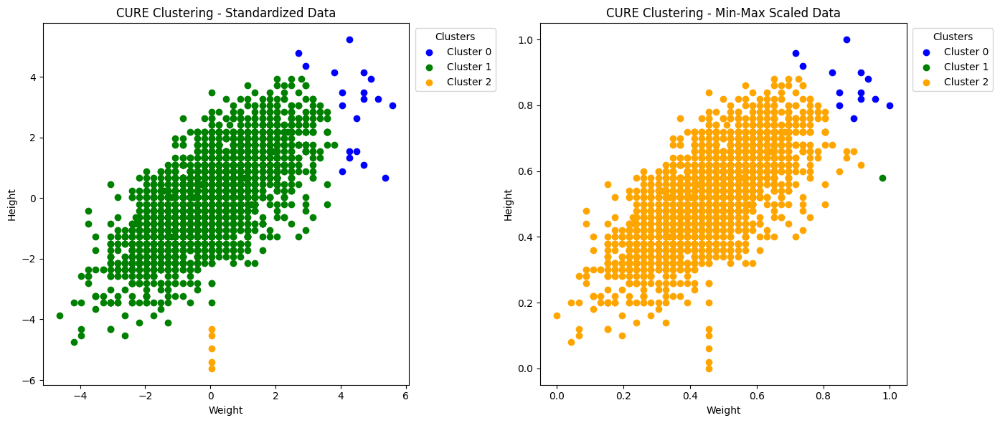

In [ ]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_wh_standard.values, data_wh_minmax.values, 3, 'Weight', 'Height')

### 2. Applying CURE to *bmi* and *avg_position*.

For *bmi* and *avg_position* the number of cluster still three.

In this plot, Cluster 0 is the largest, followed by Cluster 1, which contains approximately 1,000 elements. Cluster 2 can be considered a noisy cluster.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6130 points
Cluster 1: 1 points
Cluster 2: 3 points
Silhouette Score: 0.7196251832636785
Cohesion (Total Points in Clusters): 6134

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 6130 points
Cluster 1: 1 points
Cluster 2: 3 points
Silhouette Score: 0.6071655590836285
Cohesion (Total Points in Clusters): 6134


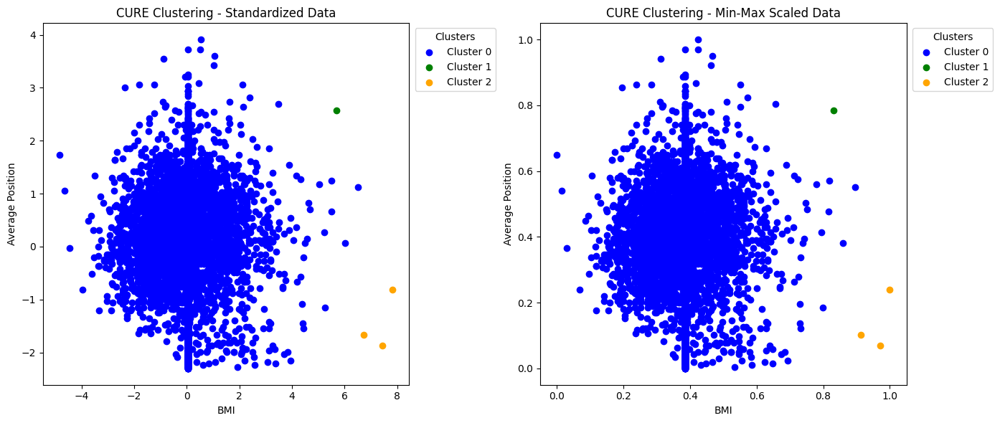

In [ ]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_bap_standard.values, data_bap_minmax.values, 3, 'BMI', 'Average Position')

### 3. Applying CURE to *avg_delta* and *avg_position*.

The clustering of *avg_delta* and *avg_position* is also performed with three clusters.

It is evident that Cluster 2 contains 99% of the data, while the other two clusters can be considered as noise.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 6118 points
Cluster 1: 12 points
Cluster 2: 4 points
Silhouette Score: 0.6299447391501549
Cohesion (Total Points in Clusters): 6134

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 9 points
Cluster 1: 6124 points
Cluster 2: 1 points
Silhouette Score: 0.6217798082656368
Cohesion (Total Points in Clusters): 6134


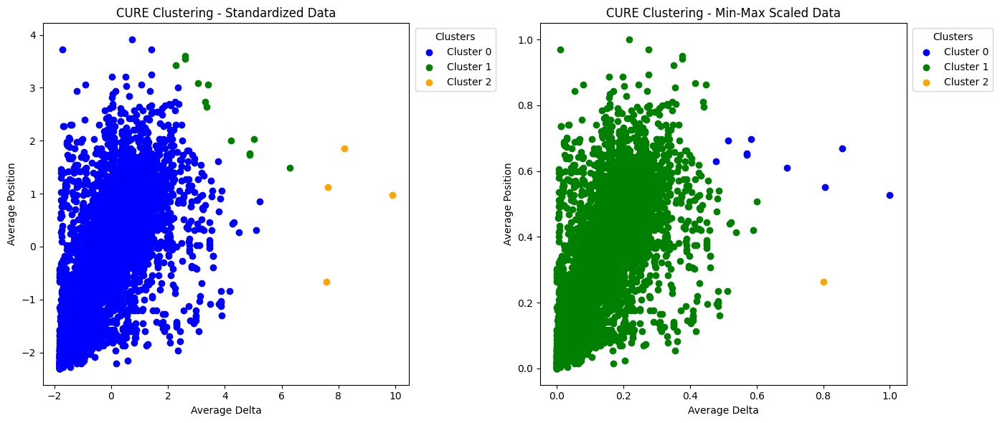

In [ ]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_adap_standard.values, data_adap_minmax.values, 3, 'Average Delta', 'Average Position')

### 4. Applying CURE to *position* and *race_intensity*.

For *position* and *race_intensity*, the number of clusters chosen is two.

The situation is similar to that observed with K-means, with two well-formed clusters containing the same values.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 457 points
Cluster 1: 53 points
Cluster 2: 4771 points
Silhouette Score: 0.5901958499161968
Cohesion (Total Points in Clusters): 5281

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 3914 points
Cluster 1: 857 points
Cluster 2: 510 points
Silhouette Score: 0.5503401599210144
Cohesion (Total Points in Clusters): 5281


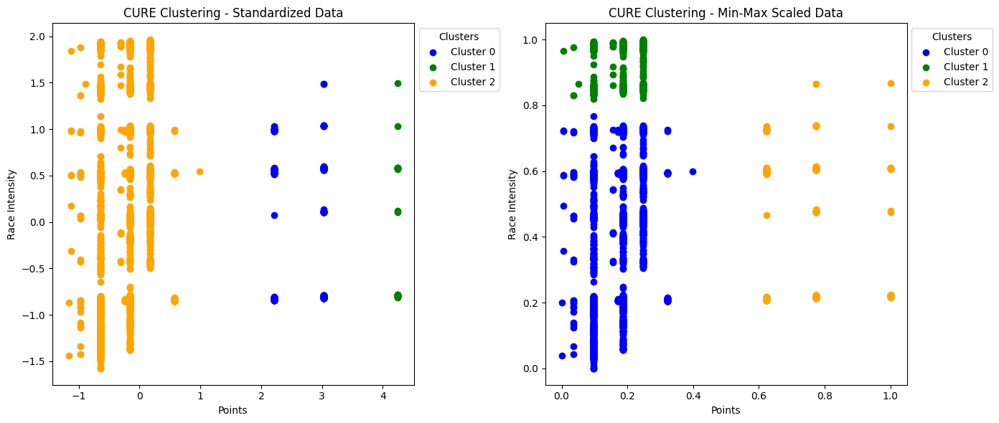

In [ ]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_pri_standard.values, data_pri_minmax.values, 3, 'Points', 'Race Intensity')

### 5. Applying CURE to *position* and *startlist_quality*.

As observed earlier, the classification based on *startlist_quality* splits the data into three clusters, with no small clusters containing only a few values.


--- CURE Clustering - Standardized Data ---
Cluster Analysis:
Cluster 0: 457 points
Cluster 1: 53 points
Cluster 2: 4771 points
Silhouette Score: 0.6114740312281586
Cohesion (Total Points in Clusters): 5281

--- CURE Clustering - Min-Max Scaled Data ---
Cluster Analysis:
Cluster 0: 62 points
Cluster 1: 448 points
Cluster 2: 4771 points
Silhouette Score: 0.5958111189207527
Cohesion (Total Points in Clusters): 5281


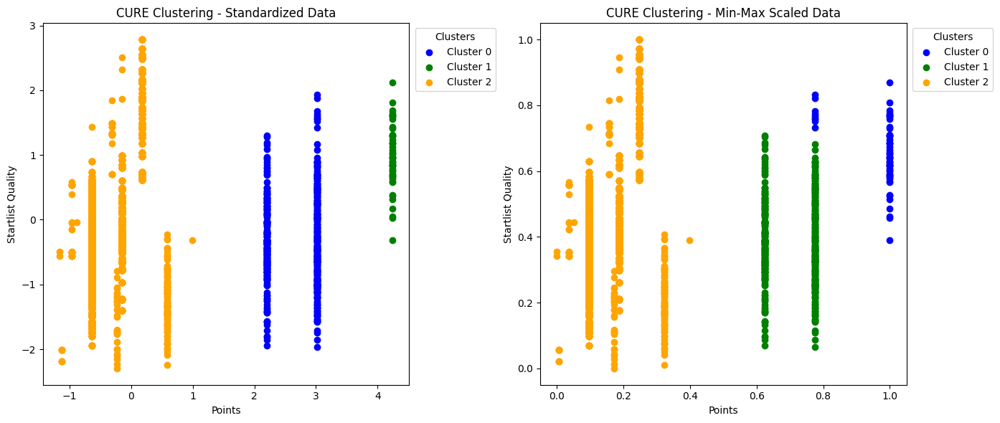

In [ ]:
# Apply CURE clustering to the data
analyze_and_plot_cure(data_psq_standard.values, data_psq_minmax.values, 3, 'Points', 'Startlist Quality')

## Analysis and Conclusions
To conclude we compare the clustering results for each pair of features and evaluate the performance of the methods used, highlighting their strengths and limitations.

- **Weight and Height**:
methods such as K-means, Complete Linkage, Ward Linkage, and Divisive clustering successfully divided the data into homogeneous clusters, effectively capturing the inherent relationships between the features. In contrast, DBSCAN, Single Linkage, Average Linkage, and CURE produced one large cluster with multiple smaller clusters. According to OPTICS, these smaller clusters were mostly classified as noise, suggesting that these methods are less suitable for these features. One could consider using these methods to remove noise first and then applying the initial methods to perform the actual clustering.

- **BMI and Average Position**:
K-means performed particularly well, similar to Average, Complete and Ward Linkage and Divisive clustering methods. This success can be attributed to the average distance metric, which is especially meaningful for these features due to their distribution. These methods produced well-separated clusters, effectively representing the variability in the data. On the other hand, DBSCAN, Single Linkage, and OPTICS identify a single large cluster with a few noisy values around it. CURE find two bigger clusters and a smaller one that contains very few values.

- **Average Delta and Average Position**:
a noticeable trend of increasing noise values was observed as avg_delta grew. While noise values were fewer in number, their presence might suggest the need for their removal in downstream clustering applications. Among the methods, CURE stood out as particularly effective, clearly distinguishing between the main cluster and the noise clusters. Among the hierarchical methods, only Ward Linkage produces a noteworthy division comparable to that of K-means.

- **Points and Race Intensity**:
methods such as DBSCAN and OPTICS divided the data along columns, with OPTICS identifying only a few noise points. Hierarchical methods, on the other hand, grouped data into multiple columns, effectively capturing the fixed nature of the *points* values. However, K-means and CURE simplified the clustering by dividing the data into two large groups, due to the empty space in the middle. This behavior demonstrates that while these methods can summarize the data, they might not fully capture the nuances of the distribution.

- **Points and Startlist Quality**:
as previously noted, the feature *startlist_quality* carries more weight than *points*, which shifts the centroids toward the right. Most methods produced cluster divisions aligned along rows, except for DBSCAN, which failed to provide meaningful clusters, reaffirming its unsuitability for this feature pair. OPTICS performed well, dividing the data into columns with minimal noise at the boundaries. Single Linkage failed to create distinct clusters, while all other methods showed results similar to K-means, effectively partitioning the data.